In [1]:
import os
import numpy as np
import fishy_net_functions as fn
import pandas as pd
import copy 
import networkx as nx
import itertools
import random
import glob
from matplotlib import pyplot as plt
from sklearn.cluster import KMeans
from scipy import signal
from scipy import stats
from matplotlib import colors as mcolors
from mpl_toolkits.mplot3d import axes3d
import seaborn as sns
sns.reset_orig()
plt.rcParams.update(plt.rcParamsDefault)
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)


# Jupyter specific autoreloading for external functions (in case changes are made)
%load_ext autoreload
%autoreload
# %matplotlib widget

# Define paths
#---------------------------------------------------------------------------
Fdrop = '/Users/dominicburrows/Dropbox/PhD/analysis/'
Fmac = '/Users/dominicburrows/Documents/'
F10t = '/Volumes/Dominic 10tb/'
Ffig = '/Users/dominicburrows/Dropbox/PhD/figures/'
Ftm = '/Volumes/Dominic Time Machine/'



ModuleNotFoundError: No module named 'fishy_net_functions'

# Load data

In [9]:
experiment = 'SPONT-CLN3MO--'
os.chdir(Fdrop + 'Project/' + experiment)

mu1trace = np.load('SPONT-CLN3MO---01_2photon_sess-01-3dpf_DMSO_run-01_realtrace.npy')
mu1coord = np.load('SPONT-CLN3MO---01_2photon_sess-01-3dpf_DMSO_run-01_realcoord.npy')
mu2trace = np.load('SPONT-CLN3MO---02_2photon_sess-01-3dpf_DMSO_run-01_realtrace.npy')
mu2coord = np.load('SPONT-CLN3MO---02_2photon_sess-01-3dpf_DMSO_run-01_realcoord.npy')
mu3trace = np.load('SPONT-CLN3MO---03_2photon_sess-01-3dpf_DMSO_run-02_realtrace.npy')
mu3coord = np.load('SPONT-CLN3MO---03_2photon_sess-01-3dpf_DMSO_run-02_realcoord.npy')
mu4trace = np.load('SPONT-CLN3MO---04_2photon_sess-01-3dpf_DMSO_run-01_realtrace.npy')
mu4coord = np.load('SPONT-CLN3MO---04_2photon_sess-01-3dpf_DMSO_run-01_realcoord.npy')

mutr1trace = np.load('SPONT-CLN3MO---05_2photon_sess-01-3dpf_RVC1_run-01_realtrace.npy')
mutr1coord = np.load('SPONT-CLN3MO---05_2photon_sess-01-3dpf_RVC1_run-01_realcoord.npy')
mutr2trace = np.load('SPONT-CLN3MO---06_2photon_sess-01-3dpf_RVC1_run-01_realtrace.npy')
mutr2coord = np.load('SPONT-CLN3MO---06_2photon_sess-01-3dpf_RVC1_run-01_realcoord.npy')
mutr3trace = np.load('SPONT-CLN3MO---07_2photon_sess-01-3dpf_RVC1_run-01_realtrace.npy')
mutr3coord = np.load('SPONT-CLN3MO---07_2photon_sess-01-3dpf_RVC1_run-01_realcoord.npy')
mutr4trace = np.load('SPONT-CLN3MO---08_2photon_sess-01-3dpf_RVC1_run-01_realtrace.npy')
mutr4coord = np.load('SPONT-CLN3MO---08_2photon_sess-01-3dpf_RVC1_run-01_realcoord.npy')



In [12]:
mulist = [mu1trace, mu2trace, mu3trace, mu4trace]
mutrlist = [mutr1trace, mutr2trace, mutr3trace, mutr4trace]
wtlist = [wt1trace, wt2trace, wt3trace, wt4trace]
wttrlist = [wttr1trace, wttr2trace, wttr3trace, wttr4trace]
amulist = []
amutrlist = []
awtlist = []
awttrlist = []

for i in range(len(mulist)):
    amulist = np.append(amulist, mulist[i])
    amutrlist = np.append(amutrlist, mutrlist[i])
    awtlist = np.append(awtlist, wtlist[i])
    awttrlist = np.append(awttrlist, wttrlist[i])


In [8]:
alist = [amulist, amutrlist, awtlist, awttrlist]
finalist = []
for i in range(len(alist)):
    finalist = np.append(finalist, alist[i])

In [243]:
maxi = np.max(finalist)
mini = np.min(finalist)

In [11]:
experiment = 'SPONT-CLN3MO++'
os.chdir(Fdrop + 'Project/' + experiment)

wt1trace = np.load('SPONT-CLN3MO++-01_2photon_sess-01-3dpf_DMSO_run-01_realtrace.npy')
wt1coord = np.load('SPONT-CLN3MO++-01_2photon_sess-01-3dpf_DMSO_run-01_realcoord.npy')
wt2trace = np.load('SPONT-CLN3MO++-02_2photon_sess-01-3dpf_DMSO_run-01_realtrace.npy')
wt2coord = np.load('SPONT-CLN3MO++-02_2photon_sess-01-3dpf_DMSO_run-01_realcoord.npy')
wt3trace = np.load('SPONT-CLN3MO++-05_2photon_sess-01-3dpf_DMSO_run-02_realtrace.npy')
wt3coord = np.load('SPONT-CLN3MO++-05_2photon_sess-01-3dpf_DMSO_run-02_realcoord.npy')
wt4trace = np.load('SPONT-CLN3MO++-06_2photon_sess-01-3dpf_DMSO_run-01_realtrace.npy')
wt4coord = np.load('SPONT-CLN3MO++-06_2photon_sess-01-3dpf_DMSO_run-01_realcoord.npy')

wttr1trace = np.load('SPONT-CLN3MO++-03_2photon_sess-01-3dpf_RVC1_run-02_realtrace.npy')
wttr1coord = np.load('SPONT-CLN3MO++-03_2photon_sess-01-3dpf_RVC1_run-02_realcoord.npy')
wttr2trace = np.load('SPONT-CLN3MO++-04_2photon_sess-01-3dpf_RVC1_run-01_realtrace.npy')
wttr2coord = np.load('SPONT-CLN3MO++-04_2photon_sess-01-3dpf_RVC1_run-01_realcoord.npy')
wttr3trace = np.load('SPONT-CLN3MO++-07_2photon_sess-01-3dpf_RVC1_run-02_realtrace.npy')
wttr3coord = np.load('SPONT-CLN3MO++-07_2photon_sess-01-3dpf_RVC1_run-02_realcoord.npy')
wttr4trace = np.load('SPONT-CLN3MO++-08_2photon_sess-01-3dpf_RVC1_run-01_realtrace.npy')
wttr4coord = np.load('SPONT-CLN3MO++-08_2photon_sess-01-3dpf_RVC1_run-01_realcoord.npy')



In [13]:
avmu1 = np.apply_along_axis(np.mean, 0, mu1trace)
avmu2 = np.apply_along_axis(np.mean, 0, mu2trace)
avmu3 =  np.apply_along_axis(np.mean, 0, mu3trace)
avmu4 =  np.apply_along_axis(np.mean, 0, mu4trace)

avmutr1 = np.apply_along_axis(np.mean, 0, mutr1trace)
avmutr2 =  np.apply_along_axis(np.mean, 0, mutr2trace)
avmutr3 =  np.apply_along_axis(np.mean, 0, mutr3trace)
avmutr4 =  np.apply_along_axis(np.mean, 0, mutr4trace)

avwt1 = np.apply_along_axis(np.mean, 0, wt1trace)
avwt2 =  np.apply_along_axis(np.mean, 0, wt2trace)
avwt3 =  np.apply_along_axis(np.mean, 0, wt3trace)
avwt4 =  np.apply_along_axis(np.mean, 0, wt4trace)


avwtr1 = np.apply_along_axis(np.mean, 0, wttr1trace)
avwtr2 =  np.apply_along_axis(np.mean, 0, wttr2trace)
avwtr3 =  np.apply_along_axis(np.mean, 0, wttr3trace)
avwtr4 =  np.apply_along_axis(np.mean, 0, wttr4trace)


In [15]:
avmulist = [avmu1, avmu2, avmu3, avmu4]
avmutrlist = [avmutr1, avmutr2, avmutr3, avmutr4]
avwtlist = [avwt1, avwt2, avwt3, avwt4]
avwttrlist = [avwtr1, avwtr2, avwtr3, avwtr4]
#navwtlist = [navwt1, navwt2, navwt3, navwt4]

In [300]:
normlist = []

for i in range(len(navwtlist)):
    normlist = np.append(normlist, navwtlist[i])


In [301]:
np.where(normlist > np.mean(normlist) + 3*np.std(normlist))

(array([ 5809,  5810,  5811,  5812,  5813,  5814,  5815,  5816,  5817,
         5818,  5819,  5820,  5821,  5823,  6516,  6517,  6518,  6519,
         6521,  6908,  6911,  6912,  6916,  7392,  7393,  7394,  7395,
         7396,  7397,  7751,  7752,  7753,  7754,  7755,  7756,  8315,
         8316,  8317,  9058,  9060,  9061,  9697,  9698,  9699,  9700,
         9701,  9702,  9704,  9967,  9968,  9969,  9970,  9971,  9972,
         9973, 10912, 15213, 15214, 15215, 15216, 15217, 15218, 15219,
        15220, 15221, 15222, 15223, 15224, 15225, 15226, 15227, 15228,
        15229, 15230, 15231, 15232, 15233, 15234, 15235, 15236, 15237,
        15238, 15239, 15240, 15241, 15242, 15243, 15244, 15245, 15246,
        15248, 15249, 15569, 15570, 15571, 15572, 15573, 15574, 15575,
        15576, 15577, 15578, 15579, 15580, 15581, 15582, 15583, 15584,
        15585, 15586, 15587, 15588, 15589, 15590, 15591, 15592, 15593,
        15594, 15595, 15596, 15597, 15598, 15599, 15600, 15601, 15602,
      

In [ ]:
    plt.figure(figsize = (15,3))
    for x in np.where(pks[cell,:])[0]: plt.axvline(x=x, c='gray')
    plt.plot(realtrace[cell,:])
    

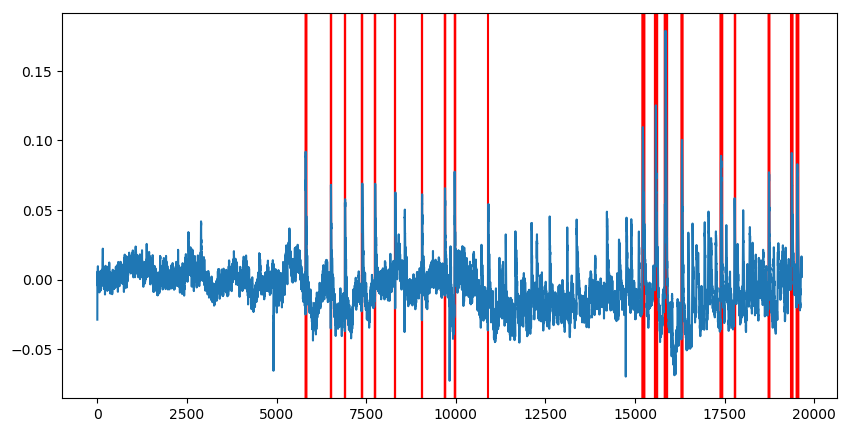

In [304]:
fig = plt.figure(figsize = (10,5))
for x in np.where(normlist > np.mean(normlist) + 3*np.std(normlist))[0]: plt.axvline(x=x, c='red')
plt.plot(normlist)
plt.show()


In [298]:
navwt4 = PCLdff

In [299]:
navwtlist = [navwt1, navwt2, navwt3, navwt4]

## USE THIS BASELINE CALCULATION FIRST TO NORMALISE TRACE - THEN RUN BCL ON THIS - CALCULATE NEW BASELINE FROM THIS AND DFF AND BINARISE

In [11]:
# Define which fish 
#---------------------------------------------------------------------------
trace2smooth = avwtr1
%load_ext autoreload
%autoreload

#PCL parameters 
#--------------------
wdt = 0.9 #spiking probability = 0.55
lamb = 0.5 #calcium decay = 0.5
varB = 0.00004 #baseline variance = 0.001
varC = 1 #calcium variance = 1
Cmean = 4 #mean calcium = 0.2
frequency = 2.7 

# Run PCL
#see = test parameters, save = save
#---------------------------------------------------------------------------------------------------------------------------
PCLcal, PCLbase, PCLsks, PCLy, PCLdff = bcl_function_parameters(Fdrop,fish,experiment, trace2smooth, wdt,lamb,varB,varC,Cmean,frequency, mode = 'see')


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


NameError: name 'bcl_function_parameters' is not defined

In [5]:
plt.figure(figsize = (25,5))
plt.plot(PCLy) #normalised, filtered trace
plt.plot(PCLcal) #modelled calcium
plt.plot(PCLbase) #modelled baseline
            #plt.plot(sks) #binary spikes
plt.plot(PCLdff) #deltaf/f
plt.show()    

NameError: name 'PCLy' is not defined

<Figure size 1800x360 with 0 Axes>

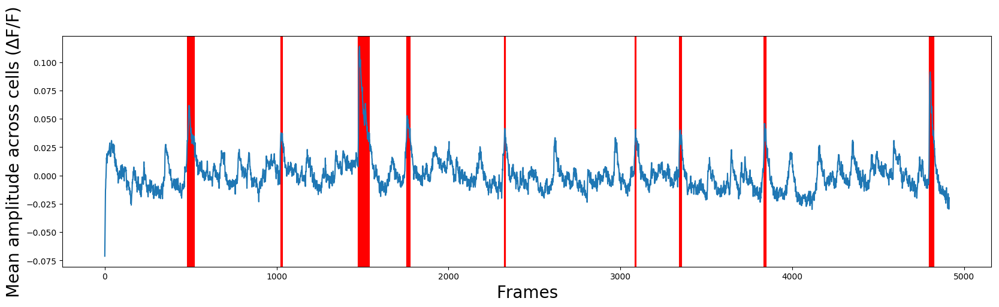

In [421]:



#alpha = ['0', '10', '20', '30', '40', '50', '60', '70']

fig, ax = plt.subplots(figsize = (20,5))

#ax.set_yticklabels(['1.0', '1.0', '1.2','1.4', '1.6', '1.8', '2.0', '2.2'], fontsize = 20)

#ax = sns.stripplot(data=meanpampdat, jitter=True, color="0", size = 10)
#ax = sns.pointplot(data=meanpampdat, linestyles = ['--'], color="#bb3f3f", size = 10,capsize = .15)
plt.ylabel("Mean amplitude across cells (ΔF/F)", size = 20, color = 'black')
plt.xlabel("Frames", size = 20, color = 'black')

#plt.xticks(np.arange(3), ('Baseline','PTZ 5mM', 'PTZ 20 mM'), size = 25, color = 'black')
#plt.yticks(color = 'black')


for x in np.where(PCLdff > np.mean(normlist) + 2*np.std(normlist))[0]: plt.axvline(x=x, c='red')
plt.plot(PCLdff)
os.chdir(Ffig)
plt.savefig('wtrvc1.png')
plt.show()

In [ ]:
frequency of whole brain events
morpholino1 (dmso) - 12, 33
morpholino2 (dmso) - 12, 20
morpholino3 (dmso) - 8, 11
morpholino4 (dmso) - 11, 16
mean = 10.75

morpholino1 (rvc1) - 19, 41
morpholino2 (rvc1) - 4, 18
morpholino3 (rvc1) - 20, 43
morpholino4 (rvc1) - 15, 18
mean = 14.5

wildtype1 (dmso) - 1, 40
wildtype2 (dmso) - 10, 22
wildtype3 (dmso) - 8, 24
wildtype4 (dmso) - 19, 34
mean = 9.4


wildtype1 (rvc) - 9 
wildtype2 (rvc) - 21
wildtype3 (rvc) - 0
wildtype4 (rvc) - 1 
mean = 7.75


In [3]:
mutantdmso = [12, 12, 8, 11]
mutantrvc1 = [19, 4, 20, 15]
wtdmso = [1, 10, 8, 19]
wtrvc = [9, 21, 0, 1]

In [4]:
meanpampdat = pd.DataFrame({'Buffer DMSO': wtdmso,'cln3MO DMSO': mutantdmso, 'Buffer PREG': wtrvc,'cln3MO PREG': mutantrvc1 })
meanpampdat

,Buffer DMSO,cln3MO DMSO,Buffer PREG,cln3MO PREG
0,1,12,9,19
1,10,12,21,4
2,8,8,0,20
3,19,11,1,15


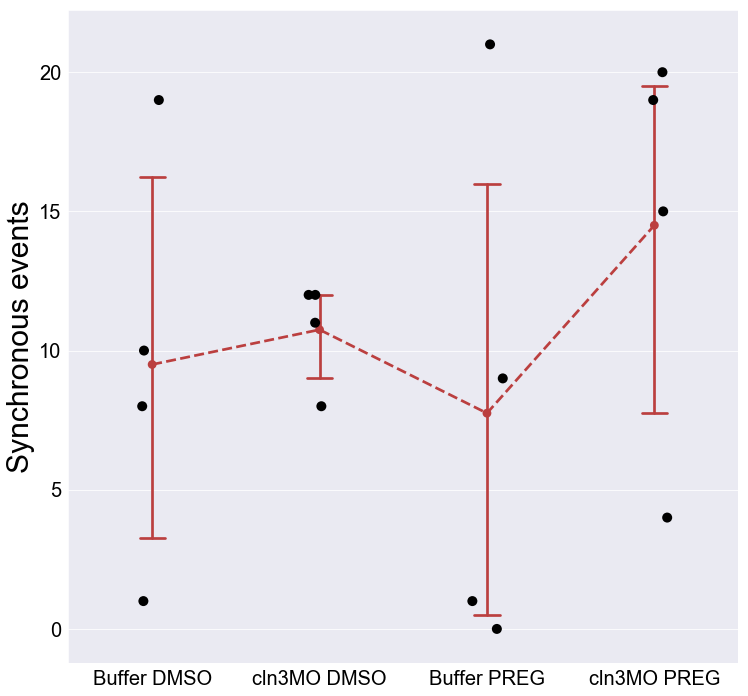

In [7]:

import seaborn as sns

sns.set_style("darkgrid")


fig, ax = plt.subplots(figsize = (12,12))

ax.set_yticklabels(['1.0', '0', '5','10', '15', '20', '2.0', '2.2'], fontsize = 20)


ax = sns.stripplot(data=meanpampdat, jitter=True, color="0", size = 10)
ax = sns.pointplot(data=meanpampdat, linestyles = ['--'], color="#bb3f3f", size = 10,capsize = .15)
plt.ylabel("Synchronous events", size = 30, color = 'black')
plt.xticks(np.arange(4), ('Buffer DMSO','cln3MO DMSO', 'Buffer PREG', 'cln3MO PREG'), size = 20, color = 'black')
plt.yticks(color = 'black')
os.chdir(Ffig)
plt.savefig('CLN3synchrony.png')
plt.show()



In [ ]:
        newvlist = list(range(len(okgoyo)))    
        for y in range(len(okgoyo)):
            newv = np.zeros(shape = (okgoyo[y].shape[0],int(okgoyo[y].shape[1]/bins)))
            print("Binning fish " + str(y))
            for i in range(okgoyo[y].shape[0]):
                
                cells = okgoyo[y][i,:]
                reshape = np.reshape(cells, (int(len(cells)/bins), bins))
                meanamp = np.apply_along_axis(np.mean, 1, reshape)
                newv[i] = meanamp
                mymean = np.apply_along_axis(np.mean, 0, newv)
                newvlist[y] = mymean

In [11]:
# Define directory and original data list
#---------------------------------------------------------------------------
#experiment = 'PTZ-WILDTYPE'
#os.chdir(Fdrop + 'Project/' + experiment)
#realcoordlist = sorted(glob.glob('*realcoord.npy'))  
#realtracelist = sorted(glob.glob('*realtrace.npy'))




#ogli = sorted(glob.glob('flt*'))

# Create list of fish to analyse (must be in order of how they appear in folder)
#fli = separately registered, sli = registered as one 3 hour recording 
#----------------------------------------------------------------------------
#fli = ['190313_wtp_F1_bln', '190313_wtp_F1_p05',   '190313_wtp_F1_p20', '190313_wtp_F2_bln', '190313_wtp_F2_p05','190313_wtp_F2_p20', '190319_wtp_F1_bln','190319_wtp_F1_p05', '190319_wtp_F1_p20', '190319_wtp_F2_bln', '190319_wtp_F2_p05', '190319_wtp_F2_p20', '190321_wtp_F1_bln', '190321_wtp_F1_p05', '190321_wtp_F1_p20', '190325_wtp_F1_bln', '190325_wtp_F1_p05', '190325_wtp_F1_p20', '190325_wtp_F3_bln', '190325_wtp_F3_p05', '190325_wtp_F3_p20', '190409_wtp_F1_bln', '190409_wtp_F1_p05', '190409_wtp_F1_p20', '190409_wtp_F2_bln', '190409_wtp_F2_p05', '190409_wtp_F2_p20']

#Create dictionaries - names are given by fli
#------------------------------------------------------------------------------------
Fishat = {} #all traces for a fish
Fishac = {} #all coords for a fish
Fishit = {} #traces for each plane for a fish
Fishic = {} #coords for each plane for a fish
Fishbat = {} #binary trace for a fish
Fishbit = {} #binary traces for each plane
Fishat, Fishac, Fishbat = fn.fish_find(ogli, fli)

Loaded flt_190313_wtp_F1_bln (4914 frames)
Loaded flt_190313_wtp_F1_p05 (4914 frames)
Loaded flt_190313_wtp_F1_p20 (4914 frames)
Loaded flt_190313_wtp_F2_bln (9828 frames)
Loaded flt_190313_wtp_F2_p05 (9828 frames)
Loaded flt_190313_wtp_F2_p20 (9828 frames)
Loaded flt_190319_wtp_F1_bln (4914 frames)
Loaded flt_190319_wtp_F1_p05 (9828 frames)
Loaded flt_190319_wtp_F1_p20 (9828 frames)
Loaded flt_190319_wtp_F2_bln (9828 frames)
Loaded flt_190319_wtp_F2_p05 (9828 frames)
Loaded flt_190319_wtp_F2_p20 (9828 frames)
Loaded flt_190321_wtp_F1_bln (4914 frames)
Loaded flt_190321_wtp_F1_p05 (4914 frames)
Loaded flt_190321_wtp_F1_p20 (4914 frames)
Loaded flt_190325_wtp_F1_bln (9828 frames)
Loaded flt_190325_wtp_F1_p05 (9828 frames)
Loaded flt_190325_wtp_F1_p20 (9828 frames)
Loaded flt_190325_wtp_F3_bln (9828 frames)
Loaded flt_190325_wtp_F3_p05 (9828 frames)
Loaded flt_190325_wtp_F3_p20 (4914 frames)
Loaded flt_190409_wtp_F1_bln (9828 frames)
Loaded flt_190409_wtp_F1_p05 (9828 frames)
Loaded flt_

In [495]:
X = Fishat[fli[21]][:,:2]
Y = np.linspace(1, len(X[:,1]-1), len(X[:,1]))

In [586]:
practice

array([[  5.0467625,   1.       , 187.4268   , ..., 576.0934   ,
        796.6485   , 648.0239   ],
       [  3.41316  ,   2.       , 336.883    , ..., 137.25845  ,
        664.1235   , 206.74384  ]], dtype=float32)

In [585]:
practice = Fishat[fli[21]][:2,:]

(-2.729972517205056,
 2.5709757509131212,
 -0.9335593115834014,
 1.0053549842947094)

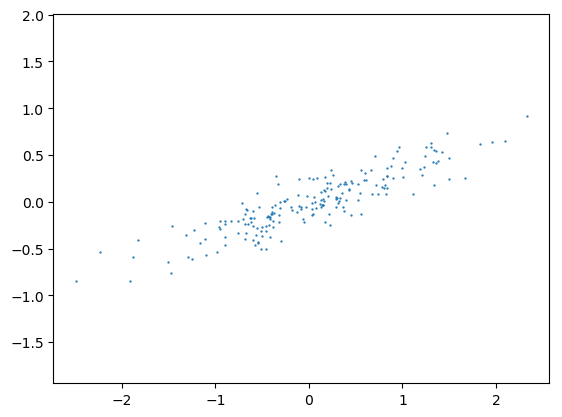

In [580]:
rng = np.random.RandomState(1)
X = np.dot(rng.rand(2, 2), rng.randn(2, 200)).T
plt.scatter(X[:, 0], X[:, 1], s = 0.4)
plt.axis('equal')

In [590]:
practice[1]

array([  3.41316,   2.     , 336.883  , ..., 137.25845, 664.1235 ,
       206.74384], dtype=float32)

In [ ]:
plt.plot[practice[1], practice[2]]

In [578]:
from sklearn.decomposition import PCA
pca = PCA(n_components= 'mle')
pca.fit(practice)
print(pca.components_)

KeyboardInterrupt: 

In [572]:
pca.n_components_

2

# Raster plots

In [53]:
for i in range(len(fli)):
    print(fli[i] + ' ' + str(i))

190313_wtp_F1_bln 0
190313_wtp_F1_p05 1
190313_wtp_F1_p20 2
190313_wtp_F2_bln 3
190313_wtp_F2_p05 4
190313_wtp_F2_p20 5
190319_wtp_F1_bln 6
190319_wtp_F1_p05 7
190319_wtp_F1_p20 8
190319_wtp_F2_bln 9
190319_wtp_F2_p05 10
190319_wtp_F2_p20 11
190321_wtp_F1_bln 12
190321_wtp_F1_p05 13
190321_wtp_F1_p20 14
190325_wtp_F1_bln 15
190325_wtp_F1_p05 16
190325_wtp_F1_p20 17
190325_wtp_F3_bln 18
190325_wtp_F3_p05 19
190325_wtp_F3_p20 20
190409_wtp_F1_bln 21
190409_wtp_F1_p05 22
190409_wtp_F1_p20 23
190409_wtp_F2_bln 24
190409_wtp_F2_p05 25
190409_wtp_F2_p20 26


In [57]:
# Plotting parameters
#--------------------------------------------------------------------------
fig1 = fli[2]
fig2 = fli[3]

# Plot
#--------------------------------------------------------------------------
plotras = fn.fish_ras(Fishat, fig1, fig2)

In [54]:
Fishat[fli[2]]

array([[ 1.1838085e+01,  6.1999977e+01,  6.0704834e+01, ...,
         1.0346772e+03,  4.4327002e+02,  4.4827505e+02],
       [-3.4919548e+00, -1.0002735e+01, -1.2983120e+01, ...,
        -7.2634411e+00, -3.5683907e+01,  7.3285713e+00],
       [ 1.4087341e+01,  1.0180017e+00, -1.0470816e+01, ...,
        -2.5105316e+01,  8.6054489e+01,  3.1250818e+00],
       ...,
       [ 1.1645786e+02, -1.4273844e+00,  7.6435677e+01, ...,
         3.1478249e+01, -8.1358166e+00,  2.7423117e+02],
       [-2.9551759e+00,  7.7760482e+00, -7.0116720e+00, ...,
         7.1160202e+01,  3.6238403e+01,  3.6871387e+01],
       [-8.8866673e+00,  4.3521814e+00, -4.6184216e+00, ...,
        -6.6864586e-01,  2.1724994e+00,  4.7635250e+00]], dtype=float32)

In [142]:
from sklearn import decomposition
pca = decomposition.PCA(n_components = 3)
x = pca.fit_transform(Fishat[fli[20]])

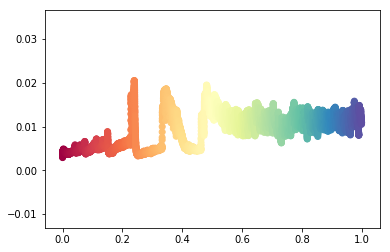

In [94]:
%matplotlib inline
plt.scatter(np.linspace(0,1, pca.components_.shape[1]),pca.components_[0,:],   c = np.linspace(0,1, pca.components_.shape[1]), cmap = 'Spectral')

In [82]:

from mpl_toolkits.mplot3d import Axes3D

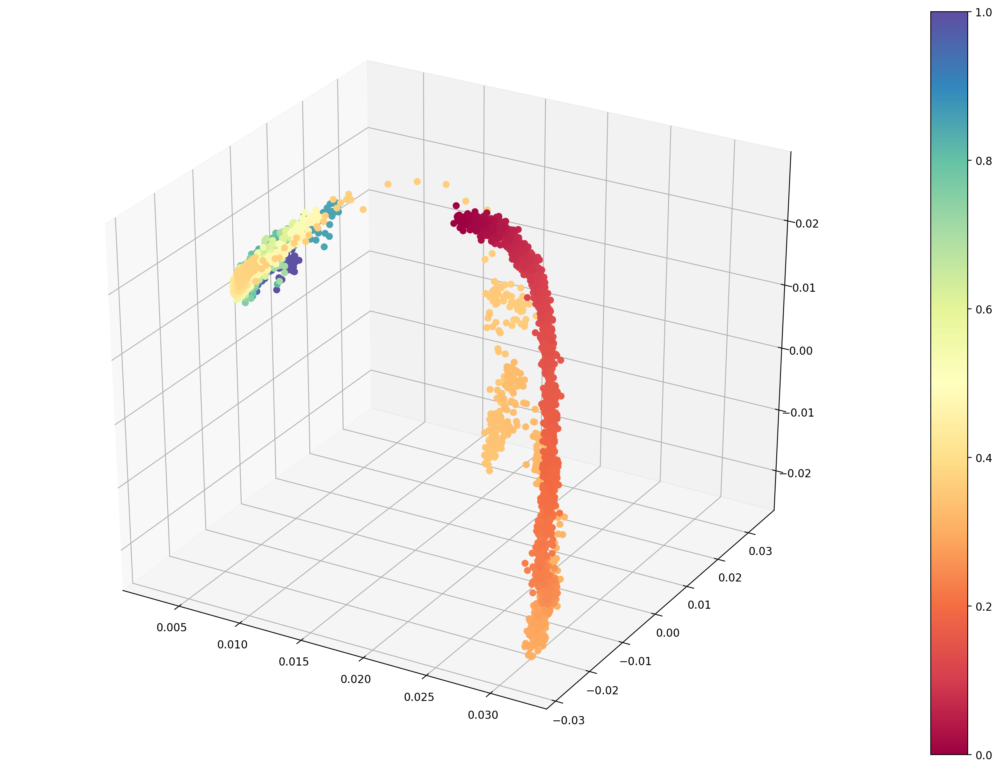

In [164]:
#%matplotlib qt

fig = plt.figure(figsize = (18,15))
ax = fig.add_subplot(111, projection='3d')


#fig, ax = plt.subplots(figsize= (18,18), projection = '3d')
#ax = fig.add_subplot(111, projection = '3d')
ax.scatter3D(xs = pca.components_[0,:], ys = pca.components_[1,:], zs = pca.components_[2,:], s = 30, c = np.linspace(0,1, pca.components_.shape[1]), alpha = 1, cmap = 'Spectral_r')
fig.colorbar(dotplot, ax = None)
os.chdir(Ffig)
plt.savefig('PCA.png')
plt.show()


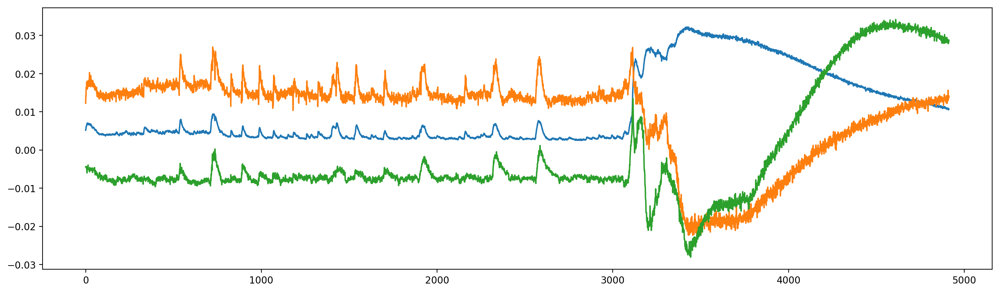

In [155]:
fig, ax = plt.subplots(figsize= (18,5))
plt.plot(pca.components_[0,:])
plt.plot(pca.components_[2,:])
plt.plot(pca.components_[1,:])
os.chdir(Ffig)
plt.savefig('pcalines.png', transparent =True)

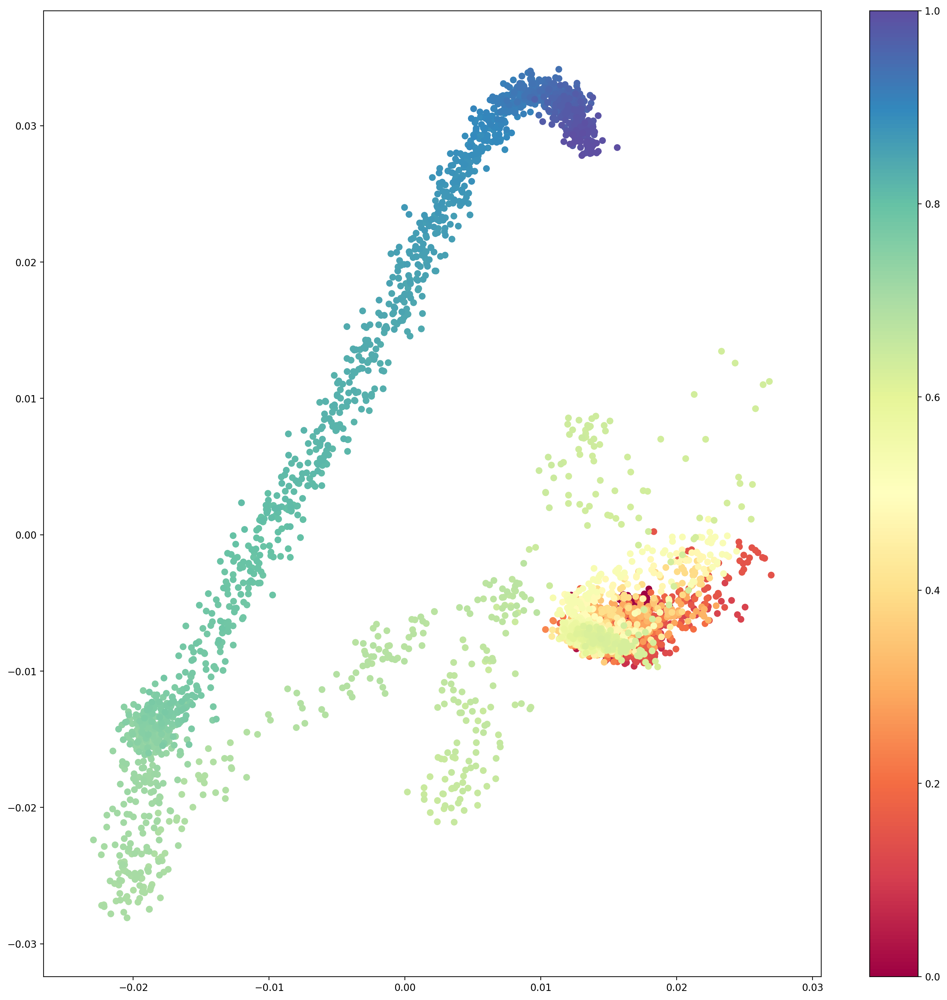

In [144]:
fig, ax = plt.subplots(figsize= (18,18))
dotplot = plt.scatter(pca.components_[2,:], pca.components_[1,:], c = np.linspace(0,1, pca.components_.shape[1]), alpha = 1, cmap = 'Spectral')
fig.colorbar(dotplot, ax = None)

In [ ]:
from sklearn.manifold import TSNE
Tsne = TSNE(n_components=2, perplexity= 50).fit_transform(Fishat[fli[5]])

In [30]:
pca.components_.shape

(3, 9828)

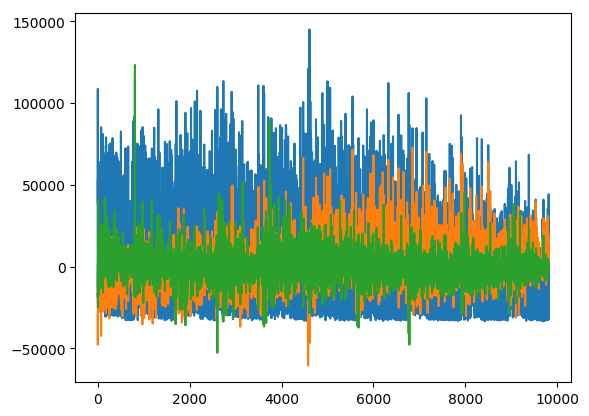

In [22]:
plt.plot(x)

In [20]:
Fishat[fli[2]].shape

(9813, 9828)

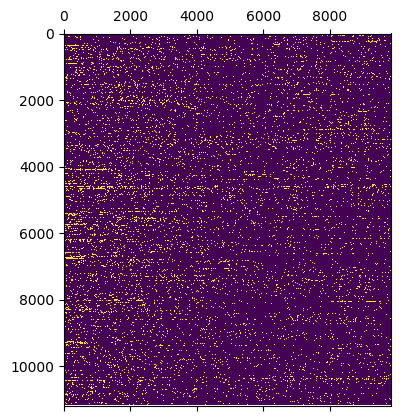

In [326]:
plt.matshow(Fishbat[fli[21]])

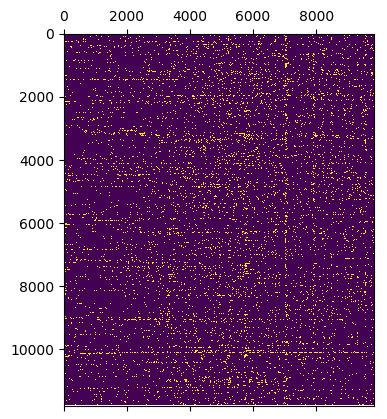

In [327]:
plt.matshow(Fishbat[fli[22]])

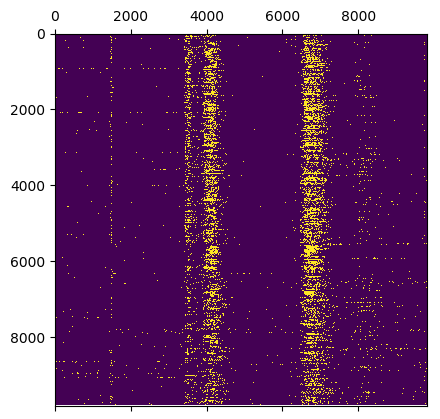

In [328]:
plt.matshow(Fishbat[fli[23]])

In [93]:
Fraw = Fdrop + 'Project/PTZ/raw/'
os.chdir(Fraw)
fishbase = np.load('baselinefish190409f1_coords.npy')
fishptz = np.load('p20fish190409f1_coords.npy')

In [87]:
pd.options.display.max_rows = 10

In [94]:
fishbln = {'xcoord': fishbase[:,0], 'ycoord': fishbase[:,1], 'plane': fishbase[:,2], 'region': fishbase[:,3]}
fishblndf = pd.DataFrame.from_dict(fishbln)
fishptz20 = {'xcoord': fishptz[:,0], 'ycoord': fishptz[:,1], 'plane': fishptz[:,2], 'region': fishptz[:,3]}
fishptzdf = pd.DataFrame.from_dict(fishptz20)

In [89]:
replacedict = {1 : 'telencephalon', 2: 'diencephalon', 3: 'midbrain', 4: 'hindbrain'}
fishdf['region_name'] = fishdf['region'].replace(replacedict)

In [90]:
fishdf.loc[  (fishdf['ycoord']<250) & (fishdf['region_name'] == 0) , 'region_name'] = 'hindbrain'

In [91]:
fishdf['region_name'].value_counts()

0.0              3789
midbrain         2718
hindbrain        2668
diencephalon     1655
telencephalon     348
Name: region_name, dtype: int64

In [100]:
fishblndf['region'].value_counts()

0.0    6419
3.0    2718
2.0    1655
1.0     348
4.0      38
Name: region, dtype: int64

In [104]:
np.max(fishbase[:,3])

4.0

In [98]:
fishptzdf

,xcoord,ycoord,plane,region
0,499.475032,323.646981,0.0,1.0
1,412.572270,369.011173,0.0,3.0
2,474.114634,410.369817,0.0,2.0
3,284.145251,385.397165,0.0,0.0
4,311.459060,370.068897,0.0,0.0
5,455.602278,342.446753,0.0,2.0
6,238.230911,348.009020,0.0,0.0
7,490.067096,392.411003,0.0,1.0
8,457.245382,416.321987,0.0,2.0
9,241.471702,169.027185,0.0,0.0


In [96]:
blndf['region_name'].value_counts()

NameError: name 'blndf' is not defined

In [84]:
replacedict2 = {0 : 'hindbrain'}
fishdf[]
fishdf[(fishdf['ycoord'] < 250) & (fishdf['region_name'] == 0)]

,xcoord,ycoord,plane,region,region_name
9,241.471702,169.027185,0.0,0.0,0
10,479.788519,208.714648,0.0,0.0,0
28,527.194480,210.008818,0.0,0.0,0
33,230.106775,206.707929,0.0,0.0,0
41,427.105733,127.950956,0.0,0.0,0
...,...,...,...,...,...
9769,466.540647,219.554108,9.0,0.0,0
9778,291.624458,246.652574,9.0,0.0,0
9785,485.913459,235.481888,9.0,0.0,0
9788,401.323961,210.791467,9.0,0.0,0


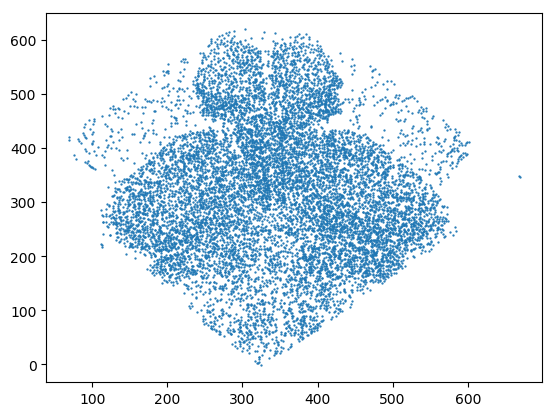

In [265]:
plt.scatter(fishdf['xcoord'], fishdf['ycoord'],s = 0.4)

In [140]:
fishdf['region_name'].value_counts()

0.0              4705
midbrain         1729
hindbrain        1638
diencephalon     1097
telencephalon     644
Name: region_name, dtype: int64

In [150]:
pd.options.display.max_rows = 10

In [266]:
blndf

,xcoord,ycoord,plane,region,region_name
0,326.156562,433.621774,0.0,0.0,unassigned
1,410.904884,345.862318,0.0,2.0,diencephalon
2,338.039799,425.634992,0.0,3.0,midbrain
3,437.279009,296.957764,0.0,2.0,diencephalon
4,481.058222,353.831576,0.0,1.0,telencephalon
...,...,...,...,...,...
11173,331.724564,306.933190,9.0,2.0,diencephalon
11174,411.680926,126.965887,9.0,0.0,hindbrain
11175,419.000759,526.060700,9.0,0.0,unassigned
11176,460.514648,392.379748,9.0,0.0,unassigned


In [225]:
blndf['region_name'].loc[(blndf['region_name'] == 0)] = 'unassigned'

/Users/dominicburrows/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:189: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


In [1]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(10,10))
ax = sns.heatmap(
    data = blndf.groupby(['plane', 'region_name']).size().unstack(0),
    square=True,
    linewidths=2,
    cmap='OrRd',
    cbar_kws={'fraction' : 0.02},
)
ax.set_title('cells per region')

NameError: name 'blndf' is not defined

In [231]:
blndf.groupby(['plane', 'region_name']).size().unstack(0)

plane,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0
region_name,,,,,,,,,,
diencephalon,82,114,92,140,166,186,179,208,247,241
hindbrain,392,393,350,343,297,269,233,184,117,90
midbrain,227,233,257,284,365,331,365,315,212,129
telencephalon,17,28,34,48,57,58,45,22,26,13
unassigned,151,210,274,356,386,421,585,517,502,387


In [163]:
blndf.groupby(['plane', 'region']).size()

plane  region
0.0    0.0       543
       1.0        17
       2.0        82
       3.0       227
1.0    0.0       603
                ... 
8.0    3.0       212
9.0    0.0       477
       1.0        13
       2.0       241
       3.0       129
Length: 43, dtype: int64

In [166]:
blndf[blndf['region'] == 0].groupby(['plane', 'region']).size().to_frame('unregistered_celln').reset_index()

,plane,region,unregistered_celln
0,0.0,0.0,543
1,1.0,0.0,603
2,2.0,0.0,624
3,3.0,0.0,688
4,4.0,0.0,661
5,5.0,0.0,685
6,6.0,0.0,818
7,7.0,0.0,701
8,8.0,0.0,619
9,9.0,0.0,477


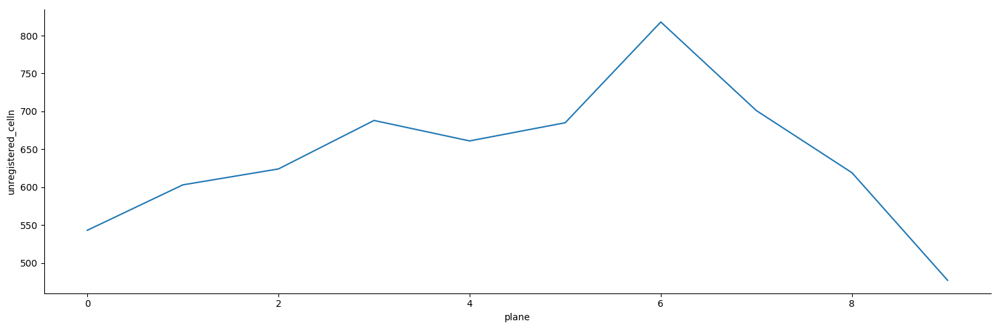

In [187]:
import seaborn as sns
sns.relplot(
    data = blndf[blndf['region'] == 0].groupby(['plane', 'region']).size().to_frame('unregistered_celln').reset_index(),
    x = 'plane',
    y = 'unregistered_celln',
    kind='line',
    aspect=3
)

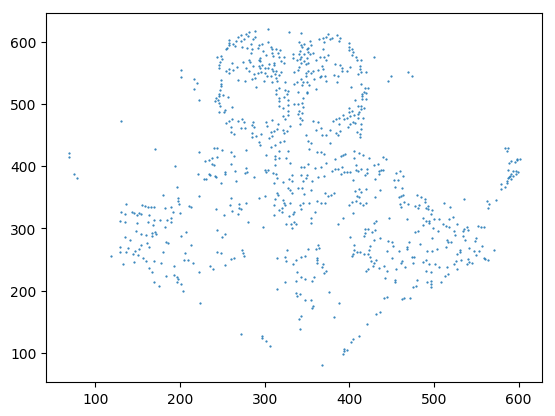

In [183]:
plt.scatter(blndf['xcoord'][blndf['plane'] ==9], blndf['ycoord'][blndf['plane'] == 9], s = 0.3)

In [159]:
p5df

NameError: name 'p5df' is not defined

In [126]:
p20df

,xcoord,ycoord,plane,region,region_name
0,499.475032,323.646981,0.0,1.0,telencephalon
1,412.572270,369.011173,0.0,3.0,midbrain
2,474.114634,410.369817,0.0,2.0,diencephalon
3,284.145251,385.397165,0.0,0.0,0
4,311.459060,370.068897,0.0,0.0,0
...,...,...,...,...,...
9808,358.406442,507.156253,9.0,3.0,midbrain
9809,457.679280,279.114801,9.0,0.0,0
9810,401.238815,611.076356,9.0,0.0,0
9811,486.482737,389.644711,9.0,0.0,0


In [168]:
tel = np.where(fishy[:,3] == 1)[0]
di = np.where(fishy[:,3] == 2)[0]
mi = np.where(fishy[:,3] == 3)[0]
hi = np.where(fishy[:,0] < 280 )[0]


In [173]:
telar = Fishat[fli[23]][tel]
diar = Fishat[fli[23]][di]
miar = Fishat[fli[23]][mi]
hiar = Fishat[fli[23]][hi]


In [4]:
# Plotting regime
#--------------------------------------------------------------------------
plt.matshow(newarray, vmin= np.min(newarray), vmax =np.max(newarray))
plt.xlabel('Time', size = 20)
plt.ylabel('Cells', size = 20)
plt.colorbar()
# create an axes on the right side of ax. The width of cax will be 5%
# of ax and the padding between cax and ax will be fixed at 0.05 inch.
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)

plt.colorbar(im, cax=cax)
plt.show()

NameError: name 'newarray' is not defined

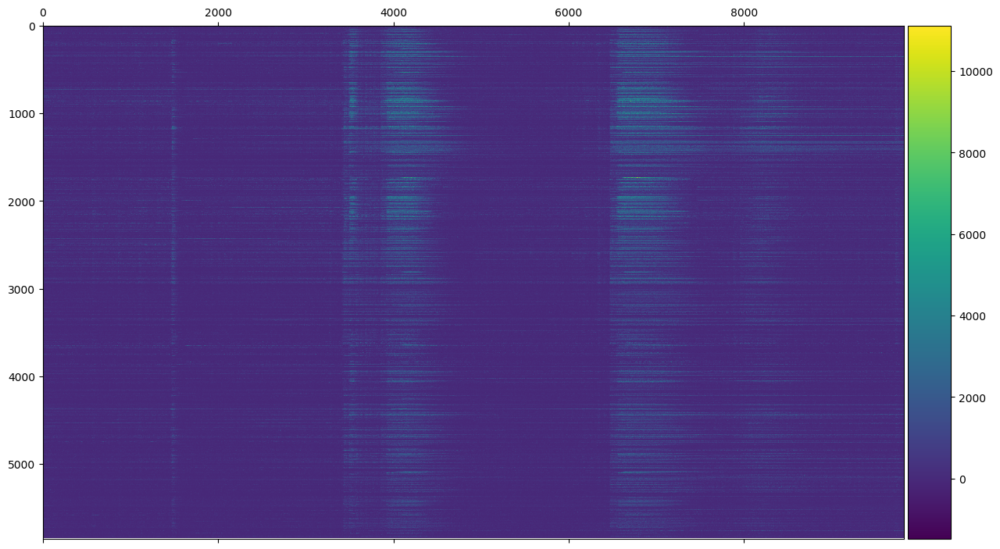

In [212]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import numpy as np

plt.figure(figsize = (15,10))
ax = plt.gca()
im = ax.matshow(newarray, vmin= np.min(newarray), vmax =np.max(newarray))

# create an axes on the right side of ax. The width of cax will be 5%
# of ax and the padding between cax and ax will be fixed at 0.05 inch.
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)

plt.colorbar(im, cax=cax)
os.chdir(Fdrop)
plt.savefig('raster.png')
plt.show()

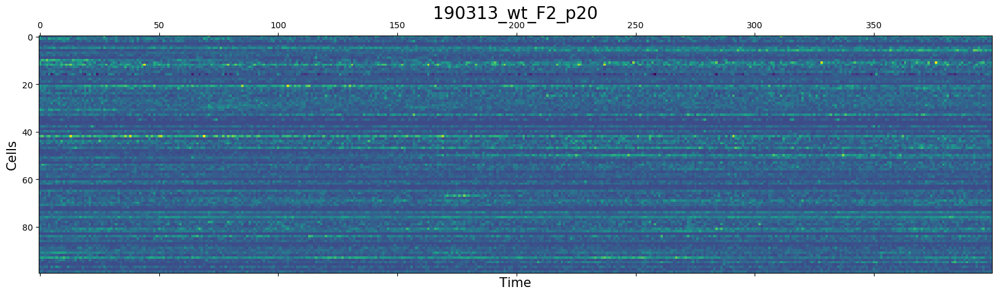

In [190]:
# Zoom
#--------------------------------------------------------------------------
figz = fli[8]
a = 100
b = 200   #yrange - cells
c = 2500
d = 2900  #xrange - time
# Plot
#--------------------------------------------------------------------------
plotras = fn.fish_zoom(Fishat, figz, a,b,c,d)

Visualise cells - show video of cells firing - draw ROI for different regions?

# Single cell data 


# _Amplitude_

In [93]:
Fraw = Fdrop + 'Project/PTZ/raw/'
os.chdir(Fraw)
fishbln = np.load('baselinefish190409f1_coords.npy')
fishp05 = np.load('p05fish190409f1_coords.npy')
fishp20 = np.load('p20fish190409f1_coords.npy')

In [83]:
p20df
p5df
blndf

NameError: name 'p20df' is not defined

In [454]:
meanamp = np.apply_along_axis(np.mean, 0, Fishat[fli[0]])
meanamp.shape

(9828,)

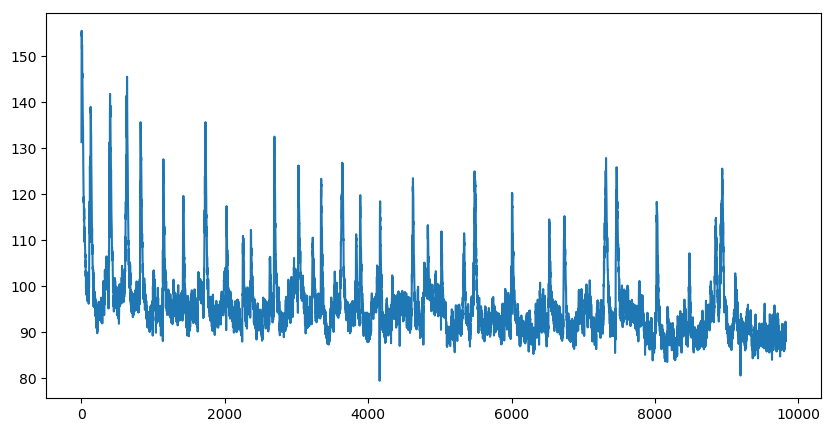

In [455]:
fig, ax = plt.subplots(figsize=(10,5))
plt.plot(meanamp)

In [605]:
rdm

[10895, 948, 560, 1293, 9329]

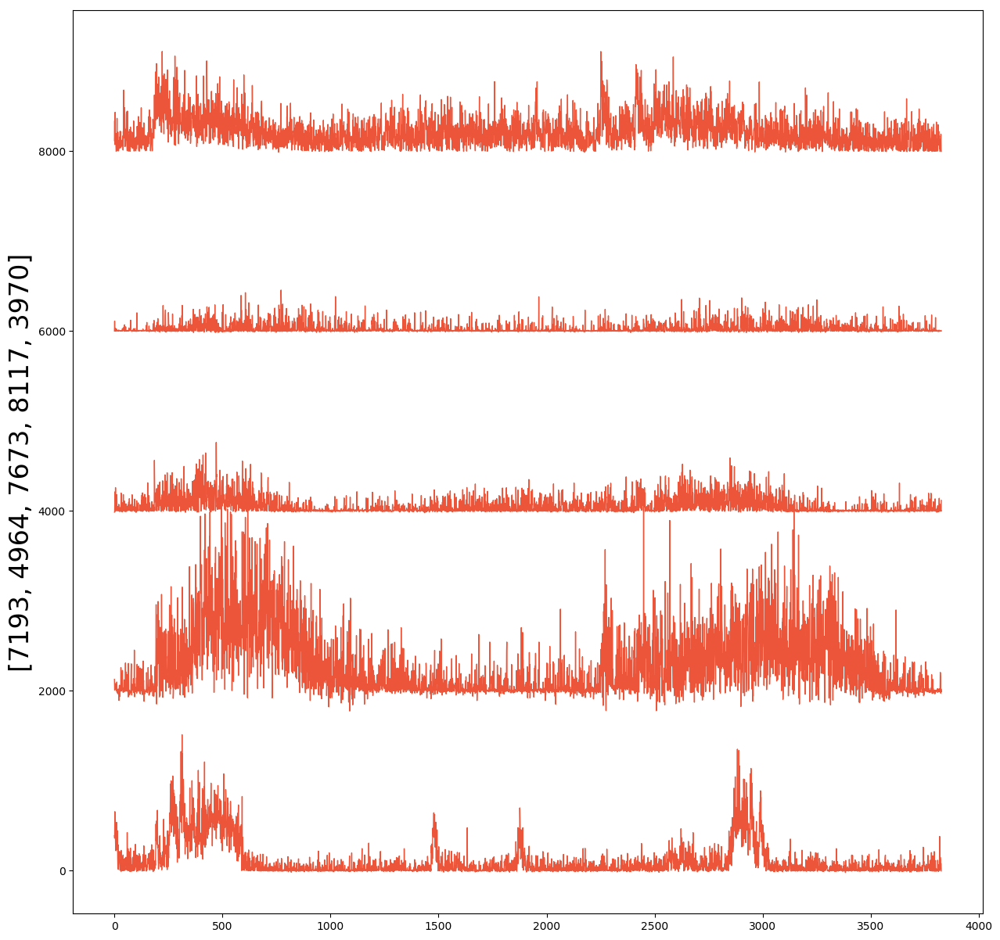

In [851]:
import random as rand
d = Fishat[fli[2]]
nplt  = 5
rdm = rand.sample(range(0, d.shape [0]), nplt)

cm    = plt.get_cmap("Paired")
fig, ax = plt.subplots(figsize=(15,15))
ax.set_ylabel(rdm, size=24)

for i in range(nplt):
    plt.plot(d[rdm][i,:][6000:] + 2000*i, linewidth = 1, color = ('#ED553B'))
    #plt.plot(d2[i,:][7000:8500] + 1000*i, color = ('#ED553B'), linewidth = 1)
    

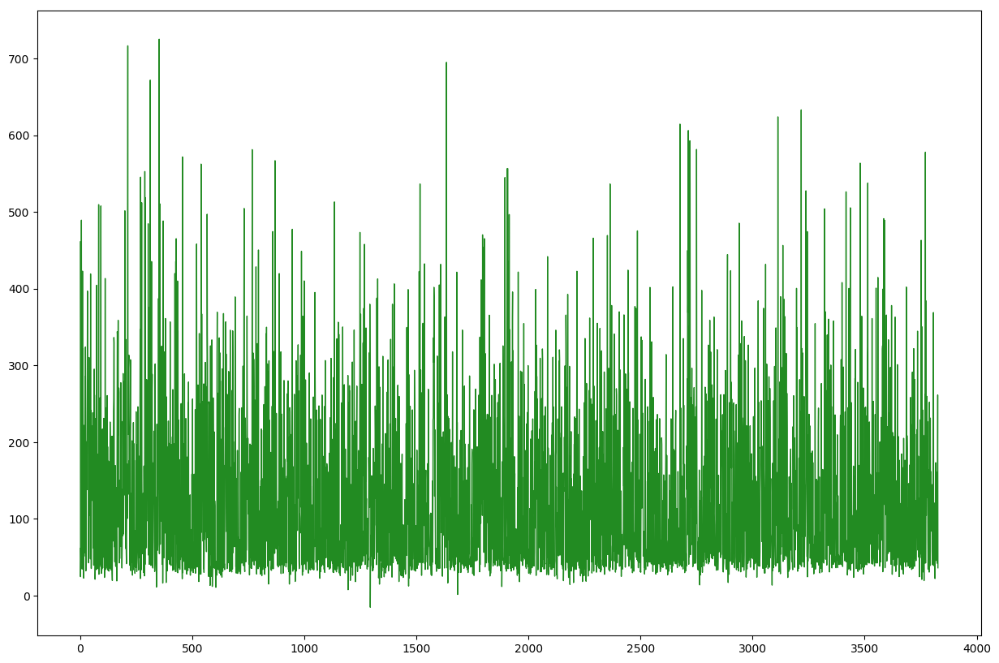

In [459]:
d = Fishat[fli[3]]
fig, ax = plt.subplots(figsize=(15,10))
#plt.plot(d[84,:][6000:], linewidth = 1, color = ('#228B22'))
plt.plot(d[2061,:][6000:], linewidth = 1, color = ('#228B22'))
#plt.plot(d[69,:][6000:] + 2000, linewidth = 1, color = ('#228B22'))
#plt.plot(d[1148,:][6000:] + 3000, linewidth = 1, color = ('#228B22'))
#plt.plot(d[13,:][6000:] + 4000, linewidth = 1, color = ('#228B22'))
os.chdir(Fraw)
#plt.savefig('rhombencephalon', transparent = True)
plt.show()

In [462]:
meanamp = np.apply_along_axis(np.mean, 0, Fishat[fli[3]])
highcut = 400
lowcut = 0

f_signal = rfft(meanamp)
f_signal[0:(2*lowcut+1)] = 0
f_signal[(2*highcut+1):len(f_signal)] = 0
meanampf = irfft(f_signal)

plt.figure(figsize=(45,8))
plt.plot(meanampf[200:9500], color = ('#000000'), linewidth = 2)
#plt.xlabel("Frames", size = 30)
os.chdir(Ffig)
#plt.savefig('wholebrain_bln.svg', transparent = True)
plt.show()

NameError: name 'rfft' is not defined

In [464]:
import numpy as np

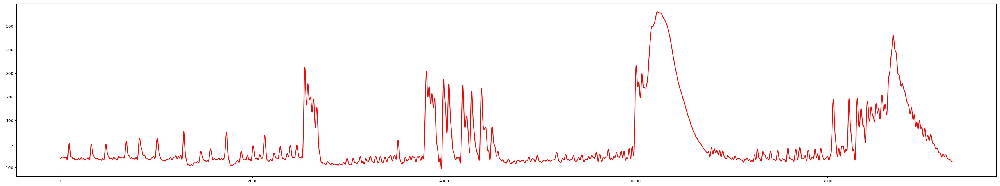

In [831]:
meanamptz = np.apply_along_axis(np.mean, 0, Fishat[fli[2]])
highcut = 400
lowcut = 0

f_signal = rfft(meanamptz)
f_signal[0:(2*lowcut+1)] = 0
f_signal[(2*highcut+1):len(f_signal)] = 0
meanamptzf = irfft(f_signal)
    


plt.figure(figsize=(45,8))
plt.plot(meanamptzf[200:9500], color = ('#FF0000'), linewidth = 2)
#plt.xlabel("Frames", size = 30)
os.chdir(Ffig)
plt.savefig('wholebrain_ptz.svg', transparent = True)
plt.show()

In [465]:
dat = Fishat[fli[2]]
olld = np.zeros(dat.shape)
highcut = 800
lowcut = 0


    # loop through each time point and apply filter
    #------------------------------------------
    
for i in range(dat.shape[0]):
    e = dat[i,:]
        
    f_signal = rfft(e)
    f_signal[0:(2*lowcut+1)] = 0
    f_signal[(2*highcut+1):len(f_signal)] = 0
       
    olld[i,:] = irfft(f_signal)
    

NameError: name 'rfft' is not defined

In [2]:
import random as rand
nplt  = 5
rdm = rand.sample(range(0, olld.shape [0]), nplt)

cm    = plt.get_cmap("Paired")
fig, ax = plt.subplots(figsize=(20,15))
ax.set_ylabel(rdm, size=24)

for i in range(nplt):
    plt.plot(olld[rdm][i,:][200:] + 2000*i, linewidth = 1, color = ('#ED553B'))
    #plt.plot(d2[i,:][7000:8500] + 1000*i, color = ('#ED553B'), linewidth = 1)

NameError: name 'olld' is not defined

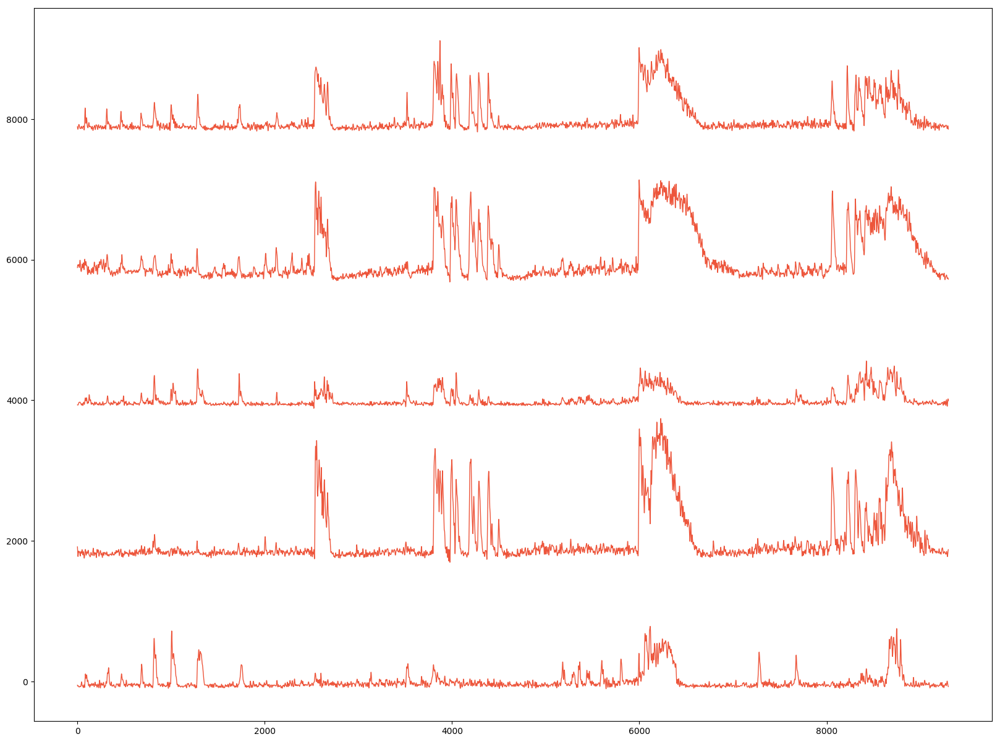

In [856]:

fig, ax = plt.subplots(figsize=(20,15))
plt.plot(olld[7193,:][200:9500], linewidth = 1, color = ('#ED553B'))
plt.plot(olld[1787,:][200:9500] + 2000, linewidth = 1, color = ('#ED553B'))
plt.plot(olld[4708,:][200:9500] + 4000, linewidth = 1, color = ('#ED553B'))
plt.plot(olld[4069,:][200:9500] + 6000, linewidth = 1, color = ('#ED553B'))
plt.plot(olld[1084,:][200:9500] + 8000, linewidth = 1, color = ('#ED553B'))
os.chdir(Ffig)
plt.savefig('cell_synchrony_ptz.svg', transparent = True)
plt.show()

In [98]:
telb = Fishat[fli[0]][fishdf['region_name'] == 'telencephalon']
dib = Fishat[fli[0]][fishdf['region_name'] == 'diencephalon']
mib = Fishat[fli[0]][fishdf['region_name'] == 'midbrain']
hib = Fishat[fli[0]][fishdf['region_name'] == 'hindbrain']

In [502]:
telb.shape

(348, 9828)

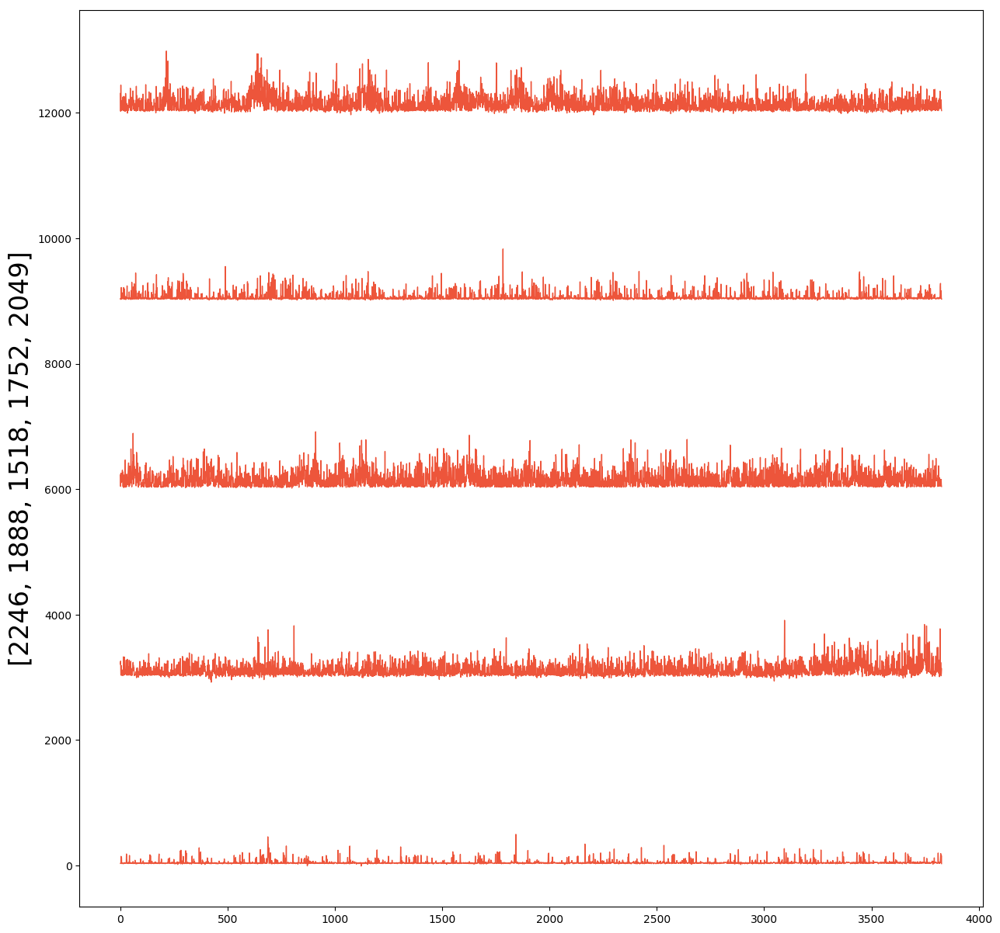

In [607]:
# Plot raw and filtered traces
#---------------------------------------------------------------------------
import random as rand
nplt  = 5
rdm = rand.sample(range(0, hib.shape [0]), nplt)
d = hib[rdm]

cm    = plt.get_cmap("Paired")
fig, ax = plt.subplots(figsize=(15,15))
ax.set_ylabel(rdm, size=24)

for i in range(nplt):
    plt.plot(d[i,:][6000:] + 3000*i, linewidth = 1, color = ('#ED553B'))
    #plt.plot(d2[i,:][7000:8500] + 1000*i, color = ('#ED553B'), linewidth = 1)
    
    
    
    


In [531]:
list = [84, 2061, 69, 1148, 13]
list

[129, 247, 710, 102, 627]

In [569]:
dat = hib
alld = np.zeros(dat.shape)
highcut = 800
lowcut = 0


    # loop through each time point and apply filter
    #------------------------------------------
    
for i in range(dat.shape[0]):
    e = dat[i,:]
        
    f_signal = rfft(e)
    f_signal[0:(2*lowcut+1)] = 0
    f_signal[(2*highcut+1):len(f_signal)] = 0
       
    alld[i,:] = irfft(f_signal)
    

In [453]:
d = telb
fig, ax = plt.subplots(figsize=(15,10))
plt.plot(alld[84,:][6000:], linewidth = 1, color = ('#228B22'))
plt.plot(alld[2061,:][6000:] + 1000, linewidth = 1, color = ('#228B22'))
plt.plot(alld[69,:][6000:] + 2000, linewidth = 1, color = ('#228B22'))
plt.plot(alld[1148,:][6000:] + 3000, linewidth = 1, color = ('#228B22'))
plt.plot(alld[13,:][6000:] + 4000, linewidth = 1, color = ('#228B22'))
os.chdir(Fraw)
plt.savefig('rhombencephalon', transparent = True)
plt.show()

NameError: name 'telb' is not defined

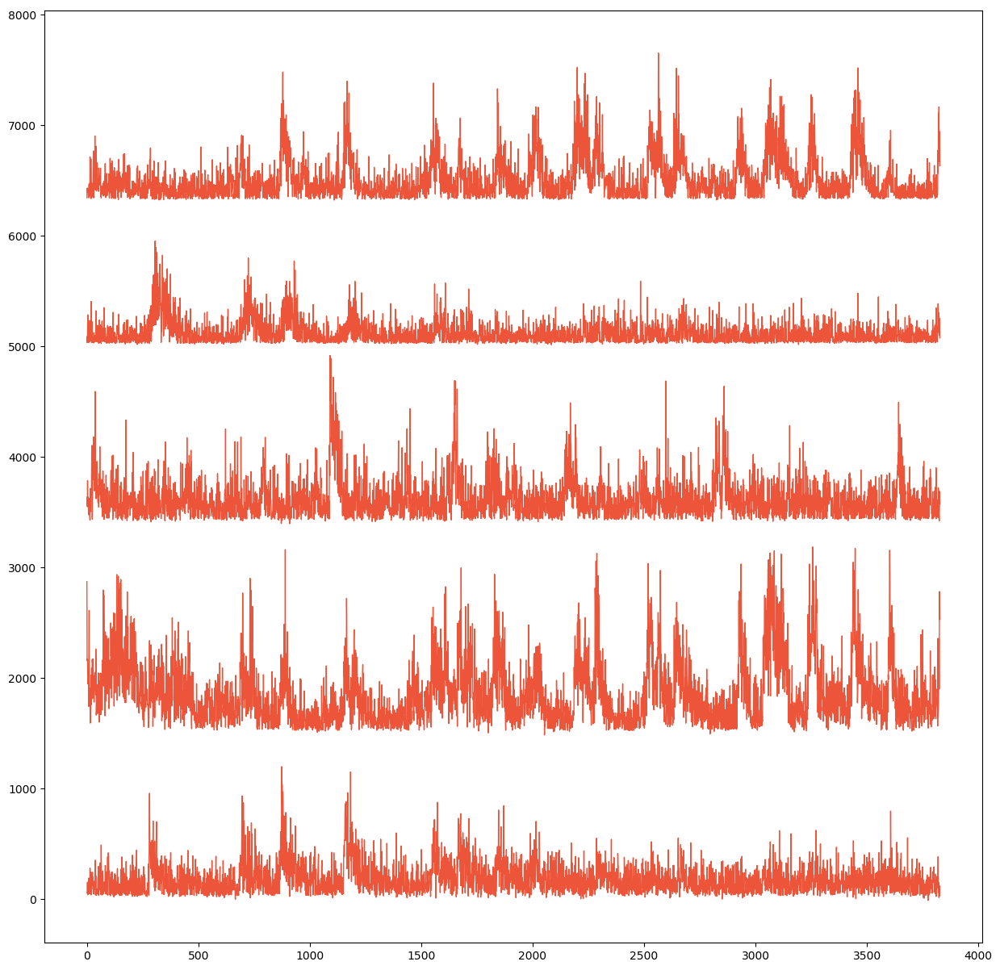

In [268]:
d = mib
fig, ax = plt.subplots(figsize=(15,15))
plt.plot(d[2460,:][6000:], linewidth = 1, color = ('#228B22'))
plt.plot(d[1474,:][6000:] + 1500, linewidth = 1, color = ('#228B22'))
plt.plot(d[243,:][6000:] + 3400, linewidth = 1, color = ('#228B22'))
plt.plot(d[289,:][6000:] + 5000, linewidth = 1, color = ('#228B22'))
plt.plot(d[465,:][6000:] + 6300, linewidth = 1, color = ('#228B22'))

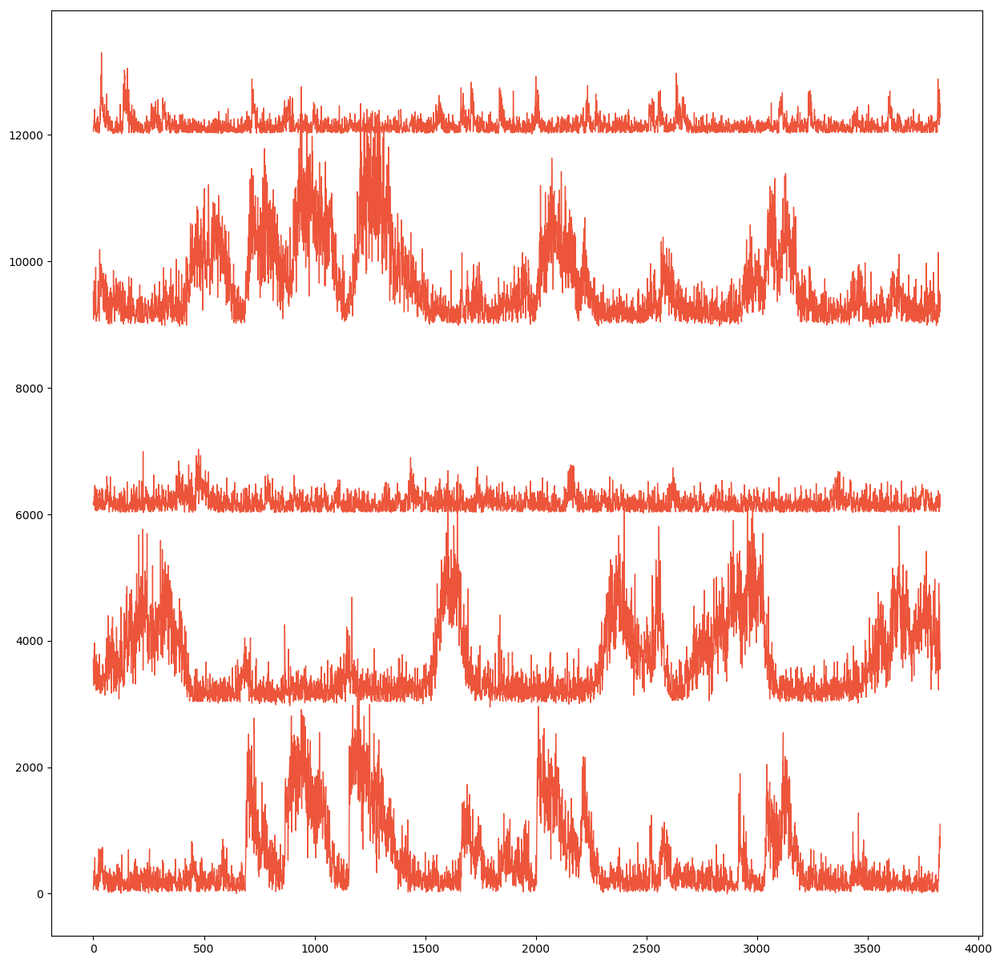

In [221]:
d = mib
fig, ax = plt.subplots(figsize=(15,15))


for i in range(len(list)):
    plt.plot(d[i,:][6000:] + 3000*i, linewidth = 1, color = ('#ED553B'))
    #plt.plot(d2[i,:][7000:8500] + 1000*i, color = ('#ED553B'), linewidth = 1)
    

In [101]:
avtelb = np.apply_along_axis(meanfunc, 0, telb)
avdib = np.apply_along_axis(meanfunc, 0, dib)
avmib = np.apply_along_axis(meanfunc, 0, mib)
avhib = np.apply_along_axis(meanfunc, 0, hib)

In [90]:
tel5 = Fishat[fli[22]][p5df['region_name'] == 'telencephalon']
di5 = Fishat[fli[22]][p5df['region_name'] == 'diencephalon']
mi5 = Fishat[fli[22]][p5df['region_name'] == 'midbrain']
hi5 = Fishat[fli[22]][p5df['region_name'] == 'hindbrain']

In [91]:
avtel5 = np.apply_along_axis(meanfunc, 0, tel5)
avdi5 = np.apply_along_axis(meanfunc, 0, di5)
avmi5 = np.apply_along_axis(meanfunc, 0, mi5)
avhi5 = np.apply_along_axis(meanfunc, 0, hi5)

In [89]:
tel20 = Fishat[fli[23]][p20df['region_name'] == 'telencephalon']
di20 = Fishat[fli[23]][p20df['region_name'] == 'diencephalon']
mi20 = Fishat[fli[23]][p20df['region_name'] == 'midbrain']
hi20 = Fishat[fli[23]][p20df['region_name'] == 'hindbrain']

In [39]:
avtel20 = np.apply_along_axis(meanfunc, 0, tel20)
avdi20 = np.apply_along_axis(meanfunc, 0, di20)
avmi20 = np.apply_along_axis(meanfunc, 0, mi20)
avhi20 = np.apply_along_axis(meanfunc, 0, hi20)
avfli = 

In [100]:
def meanfunc(vector):
    return np.mean(vector)
    

In [102]:
#Select fish 
#-------------------------------------------------
okgo = [fli[0]]

bins = 54

In [112]:
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd
import ptitprince as pt
import seaborn as sns
import os    
    
    
okgoyo = avhib
newv = np.zeros(int(okgoyo.shape[0]/bins))
    
for i in range(okgoyo.shape[0]):
                
    cells = okgoyo
    reshape = np.reshape(cells, (int(len(cells)/bins), bins))
    hibmean = np.apply_along_axis(np.mean, 1, reshape)


In [105]:
#Plotting regime for amplitude trajectory 
#-------------------------------------------------------------------------------        
plt.figure(figsize=(17,7))
plt.plot(filtel[6000:], label = 'ptz 20mm', color = ('#FF0000'), linewidth = 2)
#plt.plot(fildi[6000:] - 150, label = 'ptz 20mm', color = ('#FFFF00'), linewidth = 2)
#plt.plot(filmi[6000:]-300, label = 'baseline', color = ('#00F5FF'), linewidth = 2)
#plt.plot(filhi[6000:]-450, label = 'ptz 5mm', color = ('#51FF0D'), linewidth = 2)
#plt.xlabel("Frames", size = 30)
os.chdir(Ffig)
#plt.savefig('regional2.svg', transparent = True)
plt.show()

NameError: name 'filtel' is not defined

<Figure size 1224x504 with 0 Axes>

In [118]:
avtelb.shape

(9828,)

In [128]:
import numpy as np
from scipy.fftpack import rfft, irfft, fftfreq 

    # Filter specs

highcut = 500
lowcut = 0
    
    # loop through each time point and apply filter
    #------------------------------------------
    

t = avtelb
f_signal = rfft(t)
f_signal[0:(2*lowcut+1)] = 0
f_signal[(2*highcut+1):len(f_signal)] = 0
filtel = irfft(f_signal)

d = avdib
f_signal = rfft(d)
f_signal[0:(2*lowcut+1)] = 0
f_signal[(2*highcut+1):len(f_signal)] = 0
fildi = irfft(f_signal)


m = avmib
f_signal = rfft(m)
f_signal[0:(2*lowcut+1)] = 0
f_signal[(2*highcut+1):len(f_signal)] = 0
filmi = irfft(f_signal)

h = avhib
f_signal = rfft(h)
f_signal[0:(2*lowcut+1)] = 0
f_signal[(2*highcut+1):len(f_signal)] = 0
filhi = irfft(f_signal)

    

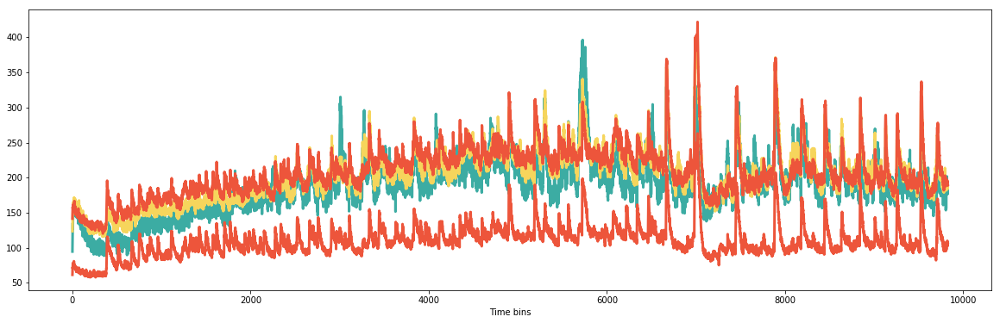

In [195]:
#Plotting regime for amplitude trajectory 
#-------------------------------------------------------------------------------        
plt.figure(figsize=(20,6,))
plt.plot(avtel5, label = 'baseline', color = ('#3CACA3'), linewidth = 3)
plt.plot(avdi5, label = 'ptz 5mm', color = ('#F6D55C'), linewidth = 3)
plt.plot(avmi5, label = 'ptz 20mm', color = ('#ED553B'), linewidth = 3)
plt.plot(avhi5, label = 'ptz 20mm', color = ('#ED553B'), linewidth = 3)
plt.xlabel("Time bins", size = 10)
#savefig('demo.png', transparent=True)
os.chdir(Fdrop)
#plt.savefig('trajectory', transparent = True)
plt.show()

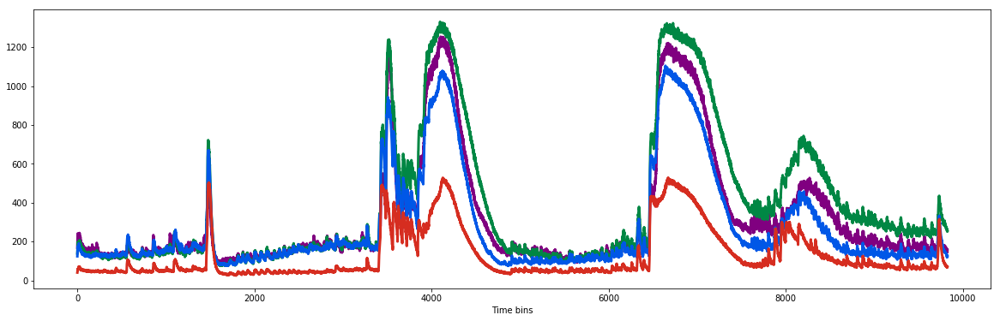

In [197]:
#Plotting regime for amplitude trajectory 
#-------------------------------------------------------------------------------        
plt.figure(figsize=(20,6,))
plt.plot(avtel20, label = 'baseline', color = ('#800080'), linewidth = 3)
plt.plot(avdi20, label = 'ptz 5mm', color = ('#008744'), linewidth = 3)
plt.plot(avmi20, label = 'ptz 20mm', color = ('#0057e7'), linewidth = 3)
plt.plot(avhi20, label = 'ptz 20mm', color = ('#D62D20'), linewidth = 3)
plt.xlabel("Time bins", size = 10)
#savefig('demo.png', transparent=True)
os.chdir(Fdrop)
plt.savefig('trajectorybln', transparent = True)
plt.show()

#008744 • #0057e7 • #d62d20 • #ffa700 • #ffffff

In [78]:
bln = np.corrcoef(Fishat[fli[0]][:,2457:])
ptz = np.corrcoef(Fishat[fli[2]][:,2457:])

In [143]:
os.chdir(Fdrop)
baseboi = np.load('blnrealreg.npy')
ptzboi = np.load('ptzrealreg.npy')

In [135]:
np.max(ptzboi)

180.0

In [137]:
baseboi.shape[0]

7937

In [188]:
baselist = list(range(180))

In [201]:
np.vstack((baselist[3], Fishat[fli[0]][1]))

array([[122.05884  ,  90.68605  ,  27.474659 , ..., 431.48917  ,
        214.50099  , 662.5944   ],
       [240.11928  ,  -2.7417068, 251.04884  , ..., 185.48752  ,
        110.075386 , 359.9871   ]], dtype=float32)

In [205]:
ptzlist = list(range(180))
for i in range(ptzboi.shape[0]):
    region = np.int(ptzboi[i])
    if np.sum(ptzlist[region]) <180:
        ptzlist[region] = Fishat[fli[2]][i]
    else:
        ptzlist[region] = np.vstack((ptzlist[region], Fishat[fli[2]][i]))

IndexError: list index out of range

In [380]:
newbln = np.zeros((180,9828))
newptz = np.zeros((180,9828))
for i in range(180):
    if np.sum(baselist[i]) > 180:
        newbln[i,:] = np.apply_along_axis(np.mean, 0, baselist[i])
    if np.sum(ptzlist[i]) > 180:
        newptz[i,:] =  np.apply_along_axis(np.mean, 0, ptzlist[i])

In [397]:
168 - bln
ptz - 124

False

In [ ]:
for i in range(newbln.shape[0]):
    if 

In [439]:
newptz

array([[ 29.25504303,  36.27968979,  38.54973984, ...,  26.60287285,
         34.46941757,  32.78707123],
       [  0.        ,   0.        ,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       [353.53411865, 353.53411865, 353.53411865, ..., 353.53411865,
        353.53411865, 353.53411865],
       ...,
       [430.47302246, 430.47302246, 430.47302246, ..., 430.47302246,
        430.47302246, 430.47302246],
       [146.20510864, 136.69444275, 179.12971497, ..., 114.97748566,
        137.51600647,  85.52436066],
       [  0.        ,   0.        ,   0.        , ...,   0.        ,
          0.        ,   0.        ]])

In [428]:
cc = np.corrcoef(newbln[:,2457:])
ptzcc = np.corrcoef(newptz[:,2457:])

In [446]:
ccinvert[:78]

array([[1.        , 0.1658315 , 0.15508896, ..., 0.3171828 , 0.2562451 ,
        0.11177251],
       [0.1658315 , 1.        , 0.03764419, ..., 0.03802371, 0.06266156,
        0.01239738],
       [0.15508896, 0.03764419, 1.        , ..., 0.10971722, 0.05326178,
        0.08545623],
       ...,
       [0.13466859, 0.00870828, 0.05752063, ..., 0.09153534, 0.04500364,
        0.058666  ],
       [0.20005854, 0.0573313 , 0.06662944, ..., 0.08133336, 0.05693505,
        0.02196002],
       [0.09643509, 0.01677968, 0.13331246, ..., 0.04216924, 0.03591219,
        0.03594417]])

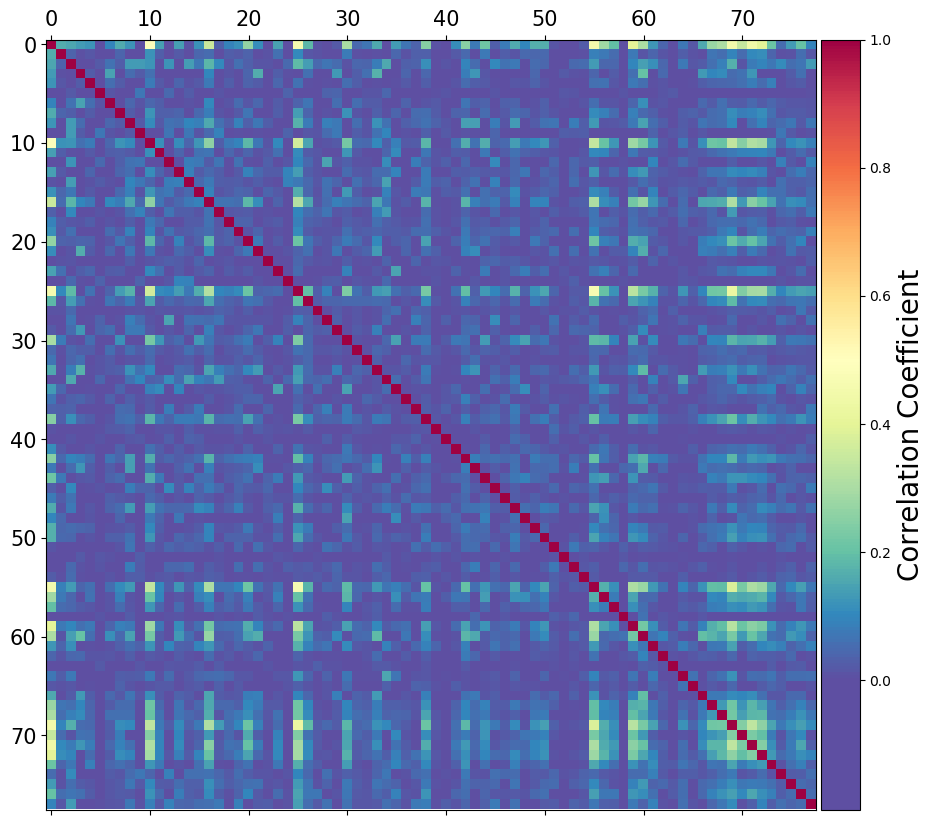

In [477]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import numpy as np

ccinvert = cc[np.invert(np.isnan(cc))]
length = int(np.sqrt(ccinvert.shape[0]))
ccinvert = np.reshape(ccinvert, (length, length))

plt.figure(figsize = (15,10))
ax = plt.gca()
im = ax.matshow(ccinvert[:78, :78], cmap = 'Spectral_r', vmin = np.min(ccinvert[:78, :78]), vmax = np.max(ptzccinvert))
divider = make_axes_locatable(ax)

alpha = ['0', '10', '20', '30', '40', '50', '60', '70']

ax.set_xticklabels(['']+alpha, fontsize = 15)
ax.set_yticklabels(['']+alpha, fontsize = 15)

cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax)
cbar.set_label('Correlation Coefficient', color='black', fontsize = 20)
cbar.set_clim(0, 1)

plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='black')
os.chdir(Fdrop)
plt.savefig('correlationbln.png', transparent = True)
plt.show()

In [437]:
int(np.sqrt(ptzccinvert.shape[0]))

8

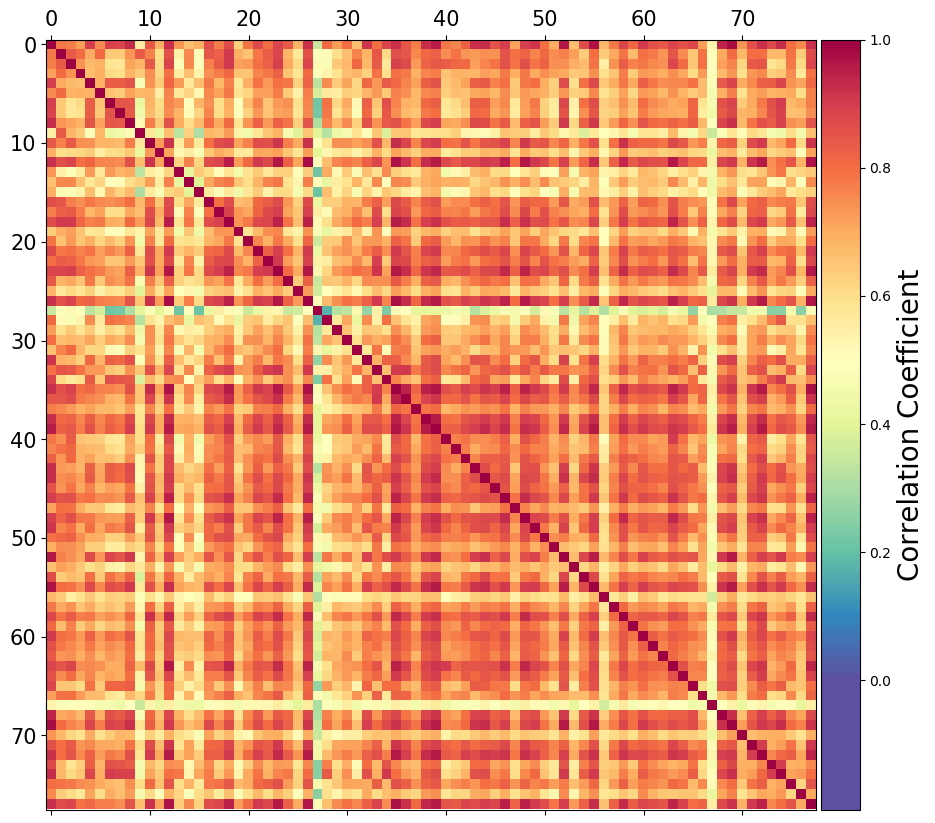

In [476]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import numpy as np

ptzccinvert = ptzcc[np.invert(np.isnan(ptzcc))]
ptzlength = int(np.sqrt(ptzccinvert.shape[0]))
ptzccinvert = np.reshape(ptzccinvert, (ptzlength, ptzlength))

plt.figure(figsize = (15,10))
ax = plt.gca()
im = ax.matshow(ptzccinvert, cmap = 'Spectral_r', vmin = np.min(ccinvert), vmax = np.max(ptzccinvert))
divider = make_axes_locatable(ax)
alpha = ['0', '10', '20', '30', '40', '50', '60', '70']

ax.set_xticklabels(['']+alpha, fontsize = 15)
ax.set_yticklabels(['']+alpha, fontsize = 15)

cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax)
cbar.set_label('Correlation Coefficient', color='black', fontsize = 20)
cbar.set_clim(0, 1)

plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='black')
plt.savefig('correlationptz.png', transparent = True)
plt.show()

In [243]:
telenp20 = [1, 0.97942125, 0.98406632, 0.92116245]
dienp20 = [0.97942125, 1, 0.96665185, 0.93479494]
midp20 = [0.98406632, 0.96665185, 1, 0.9582078]
hindp20 = [0.92116245, 0.93479494, 0.9582078, 1]


In [236]:
baselinepearson = np.vstack((telenb, dienb, midb, hindb))
baselinepearson

array([[1.        , 0.8517    , 0.87477519, 0.44897   ],
       [0.8517    , 1.        , 0.92256192, 0.44566072],
       [0.87477519, 0.92256192, 1.        , 0.62444674],
       [0.44897636, 0.44566072, 0.62444674, 1.        ]])

In [234]:
p5pearson = np.vstack((telenp5, dienp5, midp5, hindp5))
p5pearson

array([[1.        , 0.88375112, 0.78209459, 0.73270008],
       [0.88375112, 1.        , 0.93109657, 0.86442993],
       [0.78209459, 0.93109657, 1.        , 0.93498543],
       [0.7327008 , 0.86442993, 0.93498543, 1.        ]])

In [245]:
p20pearson = np.vstack((telenp20, dienp20, midp20, hindp20))
p20pearson

array([[1.        , 0.97942125, 0.98406632, 0.92116245],
       [0.97942125, 1.        , 0.96665185, 0.93479494],
       [0.98406632, 0.96665185, 1.        , 0.9582078 ],
       [0.92116245, 0.93479494, 0.9582078 , 1.        ]])

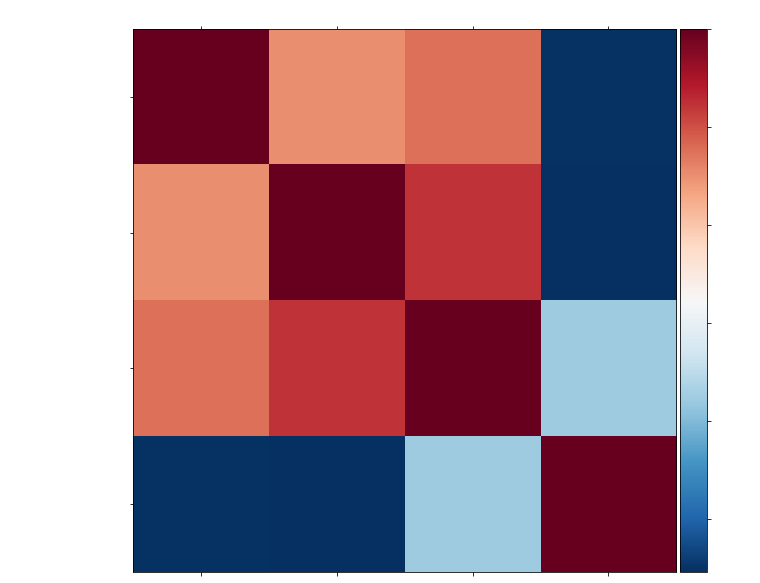

In [315]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import numpy as np

plt.figure(figsize = (15,10))
ax = plt.gca()

alpha = ['FOREBRAIN', 'DIENCEPHALON', 'MIDBRAIN', 'HINDBRAIN']

im = ax.matshow(baselinepearson, cmap = 'RdBu_r', vmin = np.min(baselinepearson), vmax = np.max(p20pearson))
divider = make_axes_locatable(ax)

ax.set_xticklabels(['']+alpha, fontsize = 15, color = 'white')
ax.set_yticklabels(['']+alpha, fontsize = 15, color = 'white')

cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax)
cbar.set_label('Correlation Coefficient', color='white', fontsize = 20)

plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='white')
plt.savefig('correlationbln', transparent = True)
plt.show()


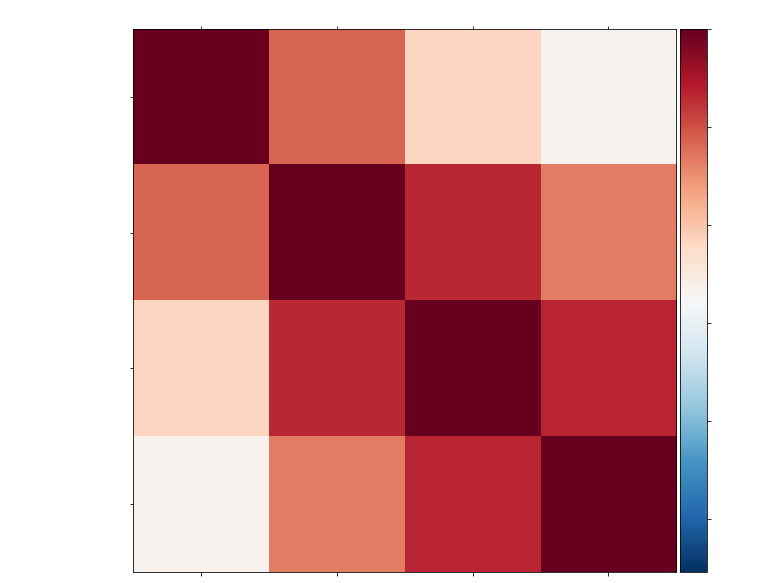

In [316]:

plt.figure(figsize = (15,10))
ax = plt.gca()

alpha = ['FOREBRAIN', 'DIENCEPHALON', 'MIDBRAIN', 'HINDBRAIN']

ax.set_xticklabels(['']+alpha, fontsize = 15, color = 'white')
ax.set_yticklabels(['']+alpha, fontsize = 15, color = 'white')
im = ax.matshow(p5pearson, cmap = 'RdBu_r', vmin = np.min(baselinepearson), vmax = np.max(p20pearson))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax)
cbar.set_label('Correlation Coefficient', color='white', fontsize = 20)

plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='white')
plt.savefig('correlationp5', transparent = True)
plt.show()



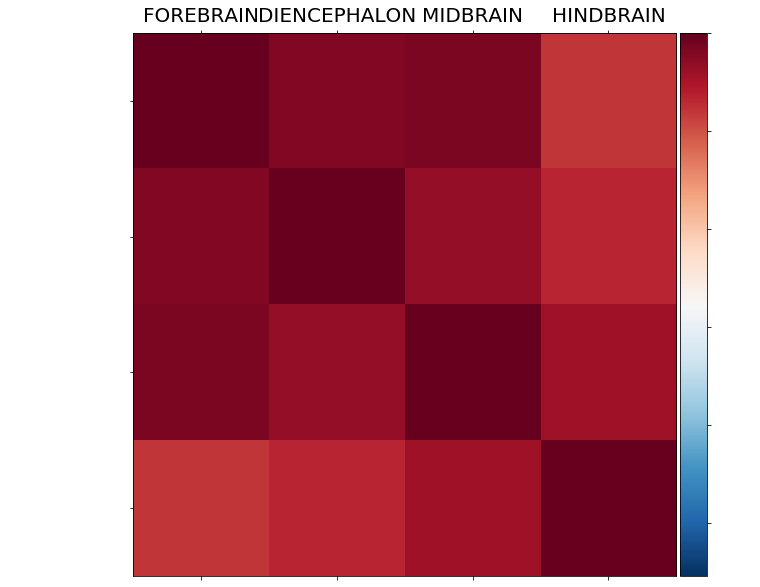

In [320]:

plt.figure(figsize = (15,10))
ax = plt.gca()

alpha = ['FOREBRAIN', 'DIENCEPHALON', 'MIDBRAIN', 'HINDBRAIN']

ax.set_xticklabels(['']+alpha, fontsize = 20, color = 'black')
ax.set_yticklabels(['']+alpha, fontsize = 15, color = 'white')
im = ax.matshow(p20pearson, cmap = 'RdBu_r', vmin = np.min(baselinepearson), vmax = np.max(p20pearson))
divider = make_axes_locatable(ax)


cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(im, cax=cax)
cbar.set_label('Correlation Coefficient', color='white', fontsize = 20)

plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='white')
plt.savefig('correlationp20', transparent = True)
plt.show()

In [237]:
np.corrcoef(avtel20, avdi20)

array([[1.        , 0.97942125],
       [0.97942125, 1.        ]])

In [238]:
np.corrcoef(avtel20, avmi20)

array([[1.        , 0.98406632],
       [0.98406632, 1.        ]])

In [239]:
np.corrcoef(avtel20, avhi20)

array([[1.        , 0.92116245],
       [0.92116245, 1.        ]])

In [240]:
np.corrcoef(avdi20, avmi20)

array([[1.        , 0.96665185],
       [0.96665185, 1.        ]])

In [241]:
np.corrcoef(avdi20, avhi20)

array([[1.        , 0.93479494],
       [0.93479494, 1.        ]])

In [242]:
np.corrcoef(avmi20, avhi20)

array([[1.       , 0.9582078],
       [0.9582078, 1.       ]])

In [ ]:
np.array[]

In [439]:
okgo = [mu1trace, mu2trace, mu3trace, mu4trace, mutr1trace, mutr2trace, mutr3trace, mutr4trace, wt1trace, wt2trace, wt3trace, wt4trace, wttr1trace, wttr2trace, wttr3trace, wttr4trace]

Binning fish 0
Binning fish 1


IndexError: list index out of range

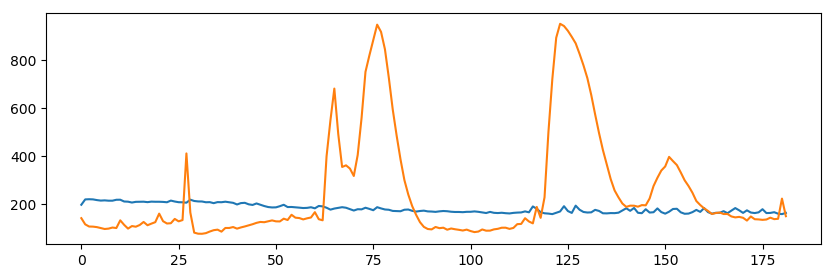

In [578]:
#Mean amplitude analysis - choose plots: Fishab = amplitude bins, Fishacl - amplitude cells, 
#plt =  choose what to plot in order of okho
#-------------------------------------------------------------------------------------------------------------------
Fishab, Fishacl = fn.fish_mamp(Fishat, fli, okgo, bins = 54, meantime = 'yes', meancells = 'no', plt1 = 0, plt2 = 1, plt3 = 2)

Are these peaks caused by synchronous events or higher amplitudes? show this

find which peaks are caused by which cells - plot them

In [30]:
#ANOVA
#-----------------------------------------------------------------------------------------------------------------
import scipy.stats as stats

data = [trudat[col].dropna() for col in trudat]
f_val, p_val = stats.f_oneway(*data)
p_val

3.136689256753325e-66

In [445]:
afc = list(range(len(okgo)))


for i in range(len(okgo)):
    meanz = list(range(okgo[i].shape[0]))
    for j in range(okgo[i].shape[0]):
        ofc = np.mean(okgo[i][j])
        meanz[j] = ofc
    afc[i] = meanz

In [508]:
cln3mudmso = [afc[0]]#, afc[1], afc[2], afc[3]]
cln3murvc1 = [afc[4]]#, afc[5], afc[6], afc[7]]
wtdmso = [afc[8]]#, afc[9], afc[10], afc[11]]
wtrvc1 = [afc[12]]#, afc[13], afc[14], afc[15]]


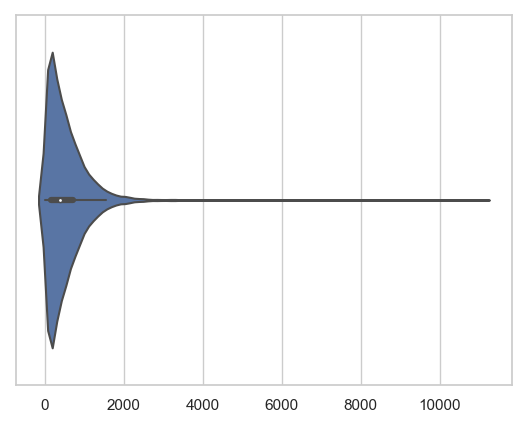

In [516]:
import seaborn as sns
sns.set(style="whitegrid")
ax = sns.violinplot(x=cln3mudmso)
plt.show()

In [488]:
ax = sns.violinplot(x="day", y=" data= trudat)

ValueError: Could not interpret input 'day'

In [518]:
dat = {'CLN3--': cln3mudmso, 'CLN3-- RVC1': cln3murvc1, 'WT': wtdmso, 'WT RVC1': wtrvc1}
datf = pd.DataFrame.from_dict(dat, orient = 'index')
trudat = datf.transpose()
sns.set()
trudat

,CLN3--,CLN3-- RVC1,WT,WT RVC1
0,"[5512.4673, 2471.125, 894.63025, 518.0182, 122...","[868.08057, 1744.9198, 1273.6953, 1400.0603, 9...","[3289.7803, 1178.5099, 1662.6677, 431.31104, 1...","[718.6289, 685.78345, 894.8609, 592.1554, 1625..."


In [526]:
ax = sns.violinplot(data=trudat)
plt.show()

ValueError: min() arg is an empty sequence

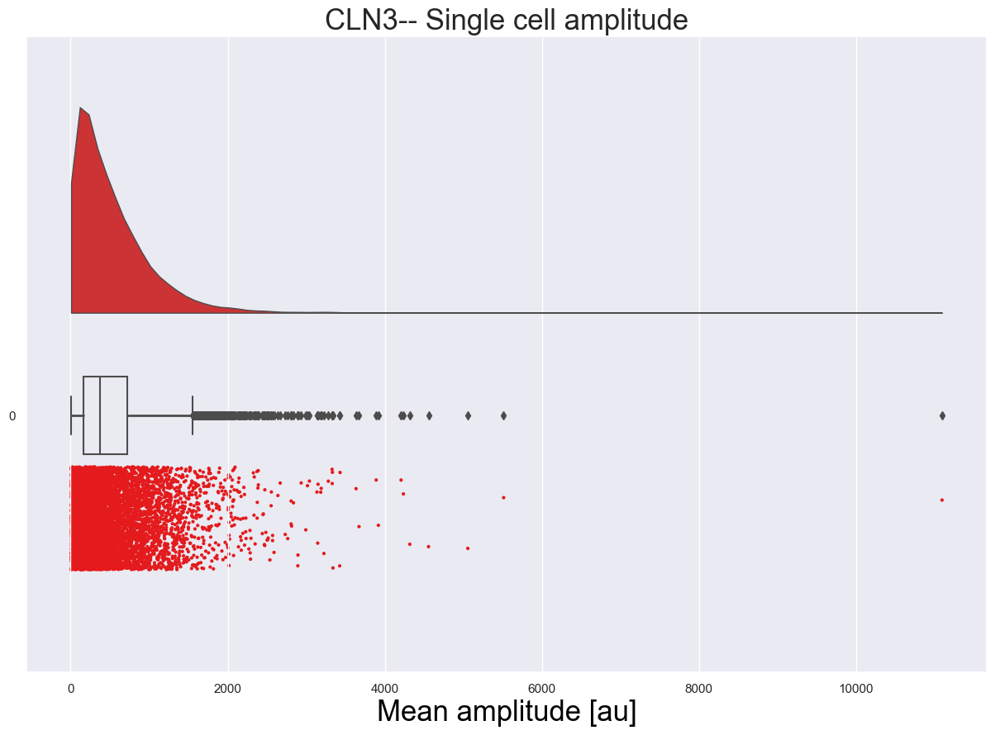

In [555]:
pal = "Set1"; sigma = .2
ax=pt.RainCloud(data = trudat['CLN3--'], palette = pal, bw = sigma, width_viol = .8, figsize = (15,10), move = 0.2, alpha = 1, orient = 'h', color = 'blue')
ax.set_title('CLN3-- Single cell amplitude', size = 25)
plt.xlabel("Mean amplitude [au]", size = 25, color = 'black')
#plt.xticks(np.arange(6), ('0','2000', '4000', '6000', '8000', '10000'), size = 25, color = 'black')
plt.savefig('cln3rain.png')
plt.show()

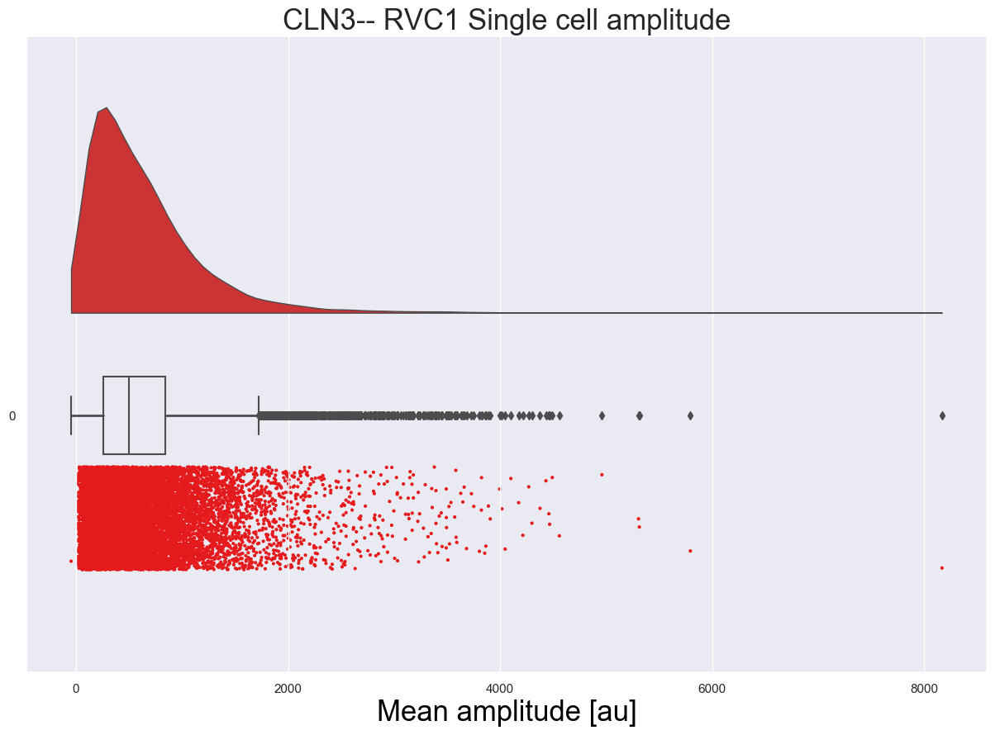

In [557]:
pal = "Set1"; sigma = .2
ax=pt.RainCloud(data = trudat['CLN3-- RVC1'], palette = pal, bw = sigma, width_viol = .8, figsize = (15,10), move = 0.2, alpha = 1, orient = 'h', color = 'blue')
ax.set_title('CLN3-- RVC1 Single cell amplitude', size = 25)
plt.xlabel("Mean amplitude [au]", size = 25, color = 'black')
#plt.xticks(np.arange(6), ('0','2000', '4000', '6000', '8000', '10000'), size = 25, color = 'black')
plt.savefig('cln3RVC1rain.png')
plt.show()

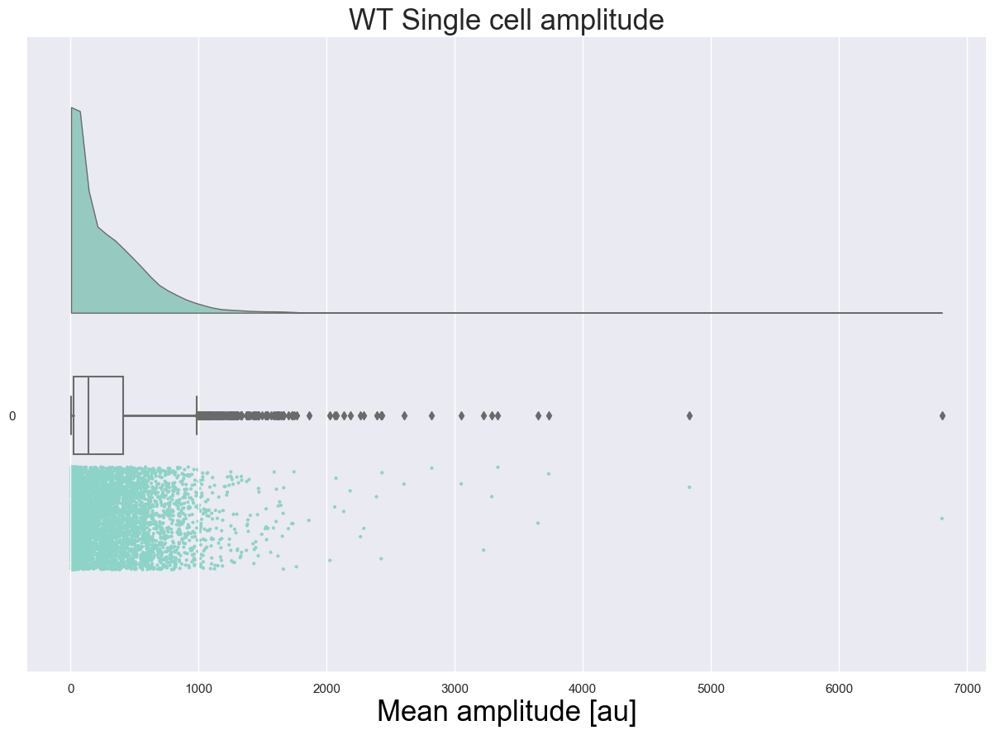

In [559]:
pal = "Set3"; sigma = .2
ax=pt.RainCloud(data = trudat['WT'], palette = pal, bw = sigma, width_viol = .8, figsize = (15,10), move = 0.2, alpha = 1, orient = 'h', color = 'blue')
ax.set_title('WT Single cell amplitude', size = 25)
plt.xlabel("Mean amplitude [au]", size = 25, color = 'black')
#plt.xticks(np.arange(6), ('0','2000', '4000', '6000', '8000', '10000'), size = 25, color = 'black')
plt.savefig('WTrain.png')
plt.show()

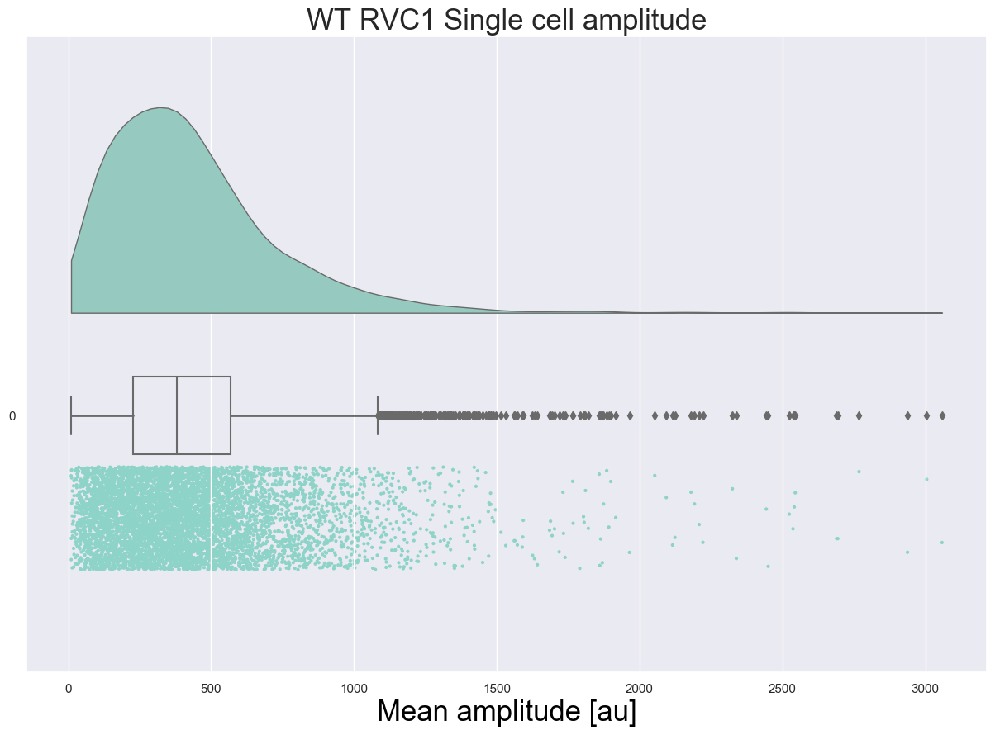

In [561]:
pal = "Set3"; sigma = .2
ax=pt.RainCloud(data = trudat['WT RVC1'], palette = pal, bw = sigma, width_viol = .8, figsize = (15,10), move = 0.2, alpha = 1, orient = 'h', color = 'blue')
ax.set_title('WT RVC1 Single cell amplitude', size = 25)
plt.xlabel("Mean amplitude [au]", size = 25, color = 'black')
#plt.xticks(np.arange(6), ('0','2000', '4000', '6000', '8000', '10000'), size = 25, color = 'black')
plt.savefig('WTRVC1rain.png')
plt.show()

In [481]:
plt.figure(figsize=(10,10))
ax = sns.violinplot(data=trudat)#, palette=['g','b','r'])
ax.set_ylabel("Mean amplitude [au]", size = 20, color = 'black')
plt.xticks(np.arange(3), ('Baseline','PTZ 5mM', 'PTZ 20 mM'), size = 15, color = 'black')
plt.yticks(color = 'black')

ValueError: min() arg is an empty sequence

In [ ]:
patalist = list(range(len(okgoyo)))
filtlist = list(range(len(okgoyo)))
afc = list(range(len(okgoyo)))

        # Calculate mean amplitude of each cells per condition 
        #---------------------------------------------------
for t in range(len(okgoyo)):
    meanz = list(range(okgoyo[t].shape[0]))
        for j in range(okgoyo[t].shape[0]):
        ofc = np.mean(okgoyo[t][j])
        meanz[j] = ofc
    afc[t] = meanz 

dat = {'baseline': afc[0], 'P5': afc[1], 'P20': afc[2]}
datf = pd.DataFrame.from_dict(dat, orient='index')
trudat = datf.transpose()
sns.set()

        #Raincloud plot
        #------------------------
pal = "Set2"; sigma = .2
ax=pt.RainCloud(data = trudat, palette = pal, bw = sigma,
                 width_viol = .8, figsize = (15,10), move = 0.2, alpha = 1, orient = 'h')
ax.set_title('Mean amplitude per cell', size = 10)
plt.show()
        
        #Violin plot showing distribution of amplitude for each cell 
        #-------------------------------------------------------------------------------
fig1 = plt.figure(figsize=(7,7))
seal1 = sns.violinplot(data=trudat)
seal1.set_ylabel("Mean amplitude per cell", size = 15)
seal1.set_title('Distribution of cell amplitudes of pre/ictal states', size = 15)
plt.show()


In [440]:
okgo = [mu1trace, mu2trace, mu3trace, mu4trace, mutr1trace, mutr2trace, mutr3trace, mutr4trace, wt1trace, wt2trace, wt3trace, wt4trace, wttr1trace, wttr2trace, wttr3trace, wttr4trace]

In [441]:
okgo

[array([[ 8.5264014e+02,  1.8362118e+03,  3.0785820e+03, ...,
          6.3768730e+03,  4.4790576e+03,  5.5434204e+03],
        [ 9.2507324e+02,  1.6553566e+03,  1.6631240e+03, ...,
          1.2316514e+03,  1.9607606e+03,  8.9898730e+02],
        [ 5.2437096e+01,  4.4414828e+02,  6.2484564e+02, ...,
          4.0788968e+02,  6.0986902e+02,  2.9483759e+02],
        ...,
        [ 1.5048325e+01,  8.2585915e+01,  9.2691288e+00, ...,
          3.7496154e+00, -9.2685318e+00,  5.3315358e+00],
        [-9.5180845e+00,  1.0804322e+01,  4.1019356e+01, ...,
          2.1993591e+01,  1.7840019e+01,  1.3135303e+02],
        [ 1.2120352e+03,  4.2802219e+02,  2.1636616e+03, ...,
          3.3059543e+02,  1.0825708e+02,  1.1581536e+03]], dtype=float32),
 array([[ 1.47180206e+02,  2.02568756e+02,  6.98116379e+01, ...,
          5.88316467e+02,  2.13185898e+02,  3.36807220e+02],
        [-7.72525406e+00, -1.09705124e+01,  3.40902527e+02, ...,
          5.74492737e+02,  9.54357910e+02,  6.15710022e+02]

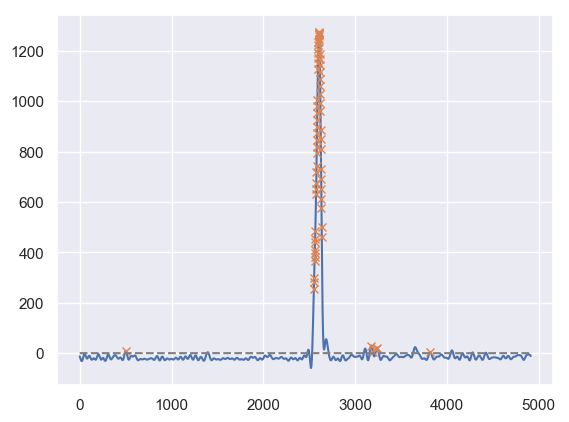

In [36]:
#Peak detection - choose fish 
#-------------------------------------------------




#typ 'py' is python peak detection (better for isolating individual calcium events),
#'std' = standard deviation (better for detecting entire time series of a peak
#exf - exc = exmp fish/cell for plotting
#Fishpyp = peak amplitude values for peaks calculated with python, Fishpkb = binary matrix of peaks (calculated with std), Fishstdp = std deviation peaks calculation
#------------------------------------------------------------------------------------------------------------------------------------------------------------------
Fishpyp, Fishpkb, Fishstdp = fn.fish_peaks(okgo, fli, Fishat, std = 'yes', py = 'no', smooth = 'yes', highcut = 100, lowcut = 0, stdlim = 3, exf = 2, exc = 1)

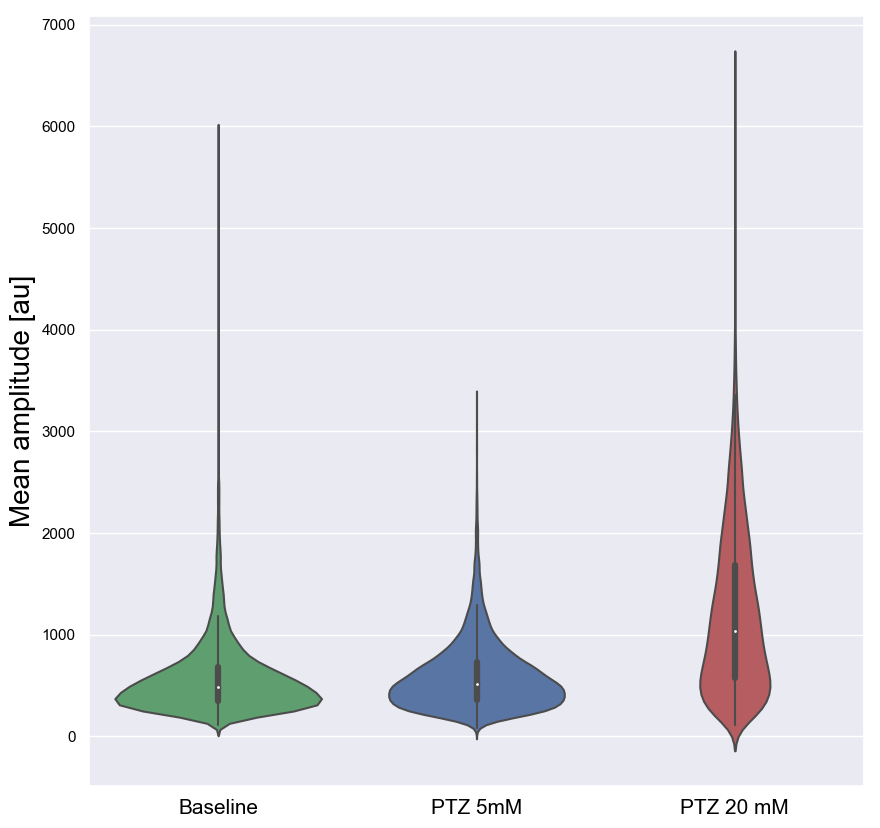

In [22]:
#Peak amplitude analysis - choose plots and input - 'si' = single peak per event (uses py peaks), 'mu' = multiple peaks for 
#duration of event (uses std cut off)
#Fish1pcm = mean of peaks for each cell 
#------------------------------------------------------------------------------------------------------------------------


Fish1cpm = fn.fish_pkamps(Ffig, Fishat, Fishpyp, Fishstdp, fli, okgo, typ = 'mu', rain = 'no', viol = 'yes', plt1 =0, plt2 = 1, plt3 =2)

In [ ]:
plt.figure(figsize=(10,10))
ax = sns.violinplot(data=trudut)
ax.set_ylabel("Mean amplitude of firing events per cell", size = 10)
plt.savefig('Violpeakamp')
plt.show()
        


plt.figure(figsize = (8,8))
ax = sns.stripplot(data=meanpampdat, jitter=True, color="1", size = 8)
ax = sns.pointplot(data=meanpampdat, linestyles = ['--'], color="#bb3f3f", capsize = .1)
plt.ylabel("Normalised mean amplitude", size = 20, color = 'white')
plt.xticks(np.arange(3), ('Baseline','PTZ 5mM', 'ptz20 mM'), size = 15, color = 'white')
plt.yticks(color = 'white')
os.chdir(Fdrop)
plt.savefig('meanpeakamplitude.png', transparent = True)
plt.show()     

use time binary bins from data to ascertain length of events, mean event length - plot this as average

Use above graph to ascertain 95% CI for what a seizure event is? 

In [35]:
#ANOVA
#-----------------------------------------------------------------------------------------------------------------
import scipy.stats as stats

data = [trudut[col].dropna() for col in trudat]
f_val, p_val = stats.f_oneway(*data)
p_val

0.0

In [23]:
for i in range(len(fli)):
    print(fli[i] + ' ' + str(i))

190313_wtp_F1_bln 0
190313_wtp_F1_p05 1
190313_wtp_F1_p20 2
190313_wtp_F2_bln 3
190313_wtp_F2_p05 4
190313_wtp_F2_p20 5
190319_wtp_F1_bln 6
190319_wtp_F1_p05 7
190319_wtp_F1_p20 8
190319_wtp_F2_bln 9
190319_wtp_F2_p05 10
190319_wtp_F2_p20 11
190321_wtp_F1_bln 12
190321_wtp_F1_p05 13
190321_wtp_F1_p20 14
190325_wtp_F1_bln 15
190325_wtp_F1_p05 16
190325_wtp_F1_p20 17
190325_wtp_F3_bln 18
190325_wtp_F3_p05 19
190325_wtp_F3_p20 20
190409_wtp_F1_bln 21
190409_wtp_F1_p05 22
190409_wtp_F1_p20 23
190409_wtp_F2_bln 24
190409_wtp_F2_p05 25
190409_wtp_F2_p20 26


In [122]:
Fishat[fli[21]].shape

(11178, 9828)

In [24]:
#Select fish - should be same fish from bln-p05-p20 in same order
#-----------------------------------------------------------------------
blnlist = [Fishat[fli[0]], Fishat[fli[3]], Fishat[fli[6]], Fishat[fli[9]], Fishat[fli[12]], Fishat[fli[15]], Fishat[fli[18]], Fishat[fli[21]], Fishat[fli[24]]]
p05list = [Fishat[fli[1]], Fishat[fli[4]], Fishat[fli[7]], Fishat[fli[10]], Fishat[fli[13]], Fishat[fli[16]], Fishat[fli[19]], Fishat[fli[22]], Fishat[fli[25]]] 
p20list = [Fishat[fli[2]], Fishat[fli[5]], Fishat[fli[8]], Fishat[fli[11]], Fishat[fli[14]], Fishat[fli[17]], Fishat[fli[20]], Fishat[fli[23]], Fishat[fli[26]]]
fullist = blnlist + p05list + p20list

In [25]:
#Combined mean amplitude and peaks means
#-----------------------------------------------------------------------
base = np.zeros(len(blnlist))
basem = np.zeros(len(blnlist))
p05m = np.zeros(len(blnlist))
p20m = np.zeros(len(blnlist))

#Calculate combined mean amplitudes (of all cells) as percentage change
#-----------------------------------------------------------------------

for i in range(len(blnlist)):
    base[i] = np.mean(blnlist[i])
    basem[i] = np.mean(blnlist[i])/np.mean(blnlist[i])
    p05m[i] = (np.mean(p05list[i]))/base[i]
    p20m[i] = (np.mean(p20list[i]))/base[i]

meanampdat = pd.DataFrame({'baseline': basem, 'PTZ 5mM': p05m, 'PTZ 20mM': p20m})
meanampdat

,baseline,PTZ 5mM,PTZ 20mM
0,1.0,1.301150,1.188746
1,1.0,1.069367,1.735603
2,1.0,0.932357,1.272845
3,1.0,1.434974,1.389507
4,1.0,1.709050,2.791747
5,1.0,1.290712,1.618034
6,1.0,1.135583,2.213254
7,1.0,0.955741,1.362959
8,1.0,1.337537,1.356285


In [30]:
#Select fish - should be same fish from bln-p05-p20 in same order
#-----------------------------------------------------------------------
#-----------------------------------------------------------------------
blnlist = [fli[0], fli[3], fli[6], fli[9], fli[12], fli[15], fli[18], fli[21], fli[24]]
p05list = [fli[1], fli[4], fli[7], fli[10], fli[13], fli[16], fli[19], fli[22], fli[25]] 
p20list = [fli[2], fli[5], fli[8], fli[11], fli[14], fli[17], fli[20], fli[23], fli[26]]
fullist = blnlist + p05list + p20list
basem = np.zeros(len(blnlist))
basep = np.zeros(len(blnlist))
p05mp = np.zeros(len(blnlist))
p20mp = np.zeros(len(blnlist))
typ = 'mu'

In [16]:
cln3mudmso = [np.mean(afc[0]), np.mean(afc[1]), np.mean(afc[2]), np.mean(afc[3])]
cln3murvc1 = [np.mean(afc[4]), np.mean(afc[5]), np.mean(afc[6]), np.mean(afc[7])]
wtdmso = [np.mean(afc[8]), np.mean(afc[9]), np.mean(afc[10]), np.mean(afc[11])]
wtrvc1 = [np.mean(afc[12]), np.mean(afc[13]), np.mean(afc[14]), np.mean(afc[15])]

NameError: name 'afc' is not defined

In [19]:
cln3mudmso = [513.891235, 373.220825, 285.906952, 159.561493]
cln3murvc1 = [636.940430, 133.510498, 559.207458, 527.982971]
wtdmso = [262.852905, 162.722580, 336.334015, 677.830383]
wtrvc1 = [438.379456, 333.008820, 135.955582, 150.002884]

In [21]:
dat = {'WT': wtdmso,'CLN3--': cln3mudmso, 'WT RVC1': wtrvc1,  'CLN3--RVC1' : cln3murvc1}
datf = pd.DataFrame.from_dict(dat, orient = 'index')
trudat = datf.transpose()
sns.set()
trudat

,WT,CLN3--,WT RVC1,CLN3--RVC1
0,262.852905,513.891235,438.379456,636.940430
1,162.722580,373.220825,333.008820,133.510498
2,336.334015,285.906952,135.955582,559.207458
3,677.830383,159.561493,150.002884,527.982971


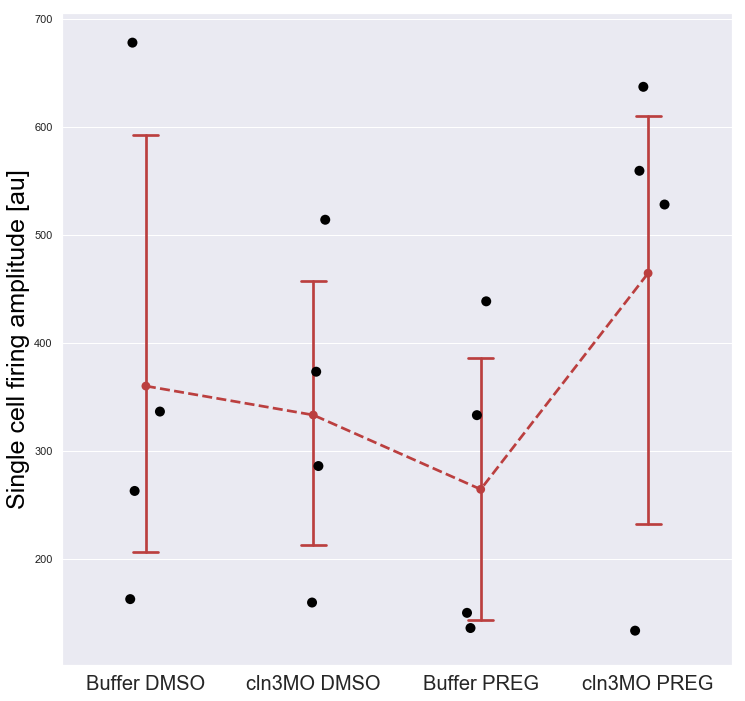

In [23]:

import seaborn as sns
sns.set_style("darkgrid")


fig, ax = plt.subplots(figsize = (12,12))

#ax.set_yticklabels(['1.0', '1.0', '1.2','1.4', '1.6', '1.8', '2.0', '2.2'], fontsize = 20)

ax = sns.stripplot(data=trudat, jitter=True, color="0", size = 10)
ax = sns.pointplot(data=trudat, linestyles = ['--'], color="#bb3f3f", size = 10,capsize = .15)
plt.ylabel("Single cell firing amplitude [au]", size = 25, color = 'black')
plt.xticks(np.arange(4), ('Buffer DMSO','cln3MO DMSO', 'Buffer PREG', 'cln3MO PREG'), size = 20)
#plt.yticks(color = 'black')
os.chdir(Ffig)
plt.savefig('cln3firingamplitude.png')
plt.show()

In [37]:
#Calculate combined mean peak amplitudes (of all cells) as percentage change
#-----------------------------------------------------------------------
if typ == 'si':
        var = Fishpyp
    
elif typ == 'mu':
        var = Fishstdp

basep = np.zeros(len(blnlist))
basemp = np.zeros(len(blnlist))
p05mp = np.zeros(len(blnlist))
p20mp = np.zeros(len(blnlist))
for i in range(len(blnlist)):

    basetp = np.zeros(Fishat[blnlist[i]].shape[0],)
    basetmp = np.zeros(Fishat[blnlist[i]].shape[0],)
    p05tmp = np.zeros(Fishat[p05list[i]].shape[0],)
    p20tmp = np.zeros(Fishat[p20list[i]].shape[0],)
    
    for y in range(Fishat[blnlist[i]].shape[0]):
        
        basetp[y] = np.mean(var[blnlist[i]][y])
        basetmp[y] = np.mean(var[blnlist[i]][y])/np.mean(var[blnlist[i]][y])
        
    for y in range(Fishat[p05list[i]].shape[0]):
        p05tmp[y] = np.mean(var[p05list[i]][y])
        
    for y in range(Fishat[p20list[i]].shape[0]):
        p20tmp[y] = (np.mean(var[p20list[i]][y]))
    
    basemp[i] = np.mean(basetmp) 
    basep[i] = np.mean(basetp)
    p05mp[i] = (np.mean(p05tmp))/basep[i]
    p20mp[i] = (np.mean(p20tmp))/basep[i]

                     
                     
meanpampdat = pd.DataFrame({'baseline': basemp, 'PTZ 5mM': p05mp, 'PTZ 20mM': p20mp})
meanpampdat

,baseline,PTZ 5mM,PTZ 20mM
0,1.0,1.122637,1.373865
1,1.0,1.169306,1.955340
2,1.0,1.057526,1.834084
3,1.0,1.218681,1.489607
4,1.0,1.480978,1.834974
5,1.0,1.196080,2.085880
6,1.0,1.082369,2.276006
7,1.0,1.039831,2.106945
8,1.0,1.242668,1.574981


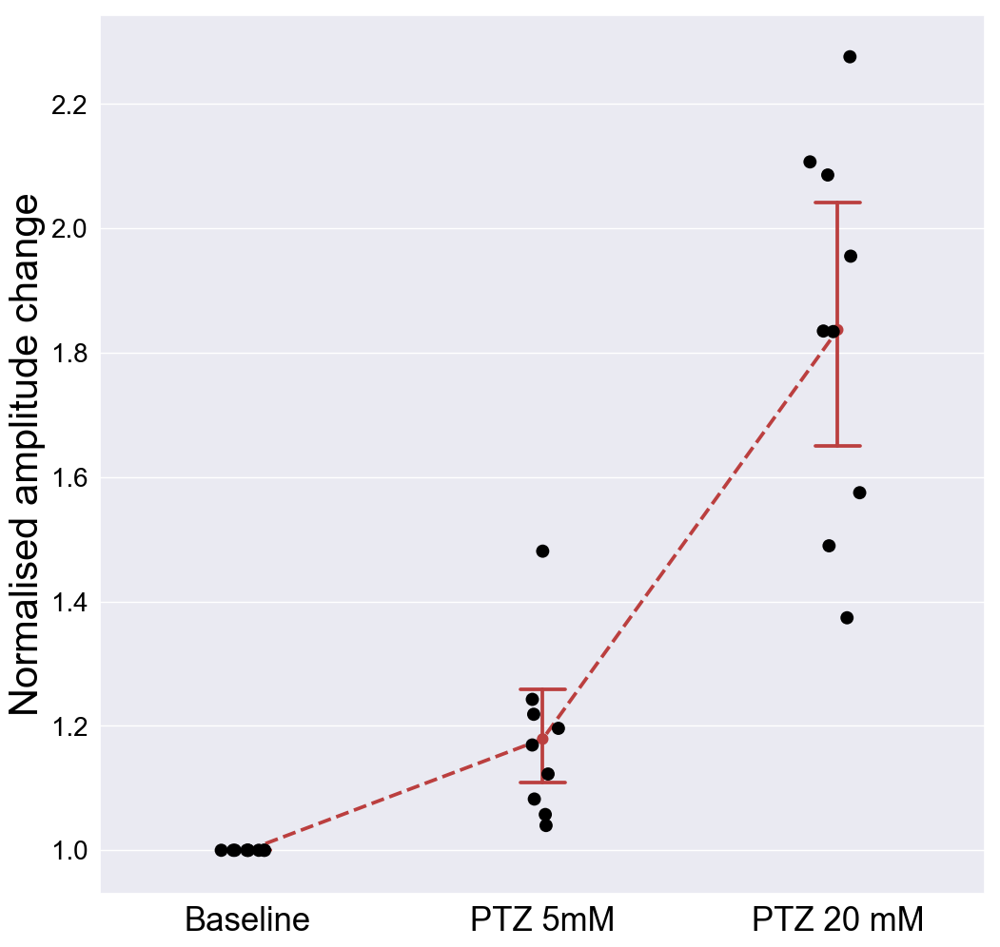

In [45]:
import seaborn as sns
sns.set_style("darkgrid")


fig, ax = plt.subplots(figsize = (12,12))

ax.set_yticklabels(['1.0', '1.0', '1.2','1.4', '1.6', '1.8', '2.0', '2.2'], fontsize = 20)


ax = sns.stripplot(data=meanpampdat, jitter=True, color="0", size = 10)
ax = sns.pointplot(data=meanpampdat, linestyles = ['--'], color="#bb3f3f", size = 10,capsize = .15)
plt.ylabel("Normalised amplitude change", size = 30, color = 'black')
plt.xticks(np.arange(3), ('Baseline','PTZ 5mM', 'PTZ 20 mM'), size = 25, color = 'black')
plt.yticks(color = 'black')
os.chdir(Ffig)
plt.savefig('meanpeakamplitude.png')
plt.show()



In [ ]:
distribution around response of 5mm ptz, z score mutant score around normal mean 

In [ ]:
5 min snapshotwindow - randomly drawn (draw many times) from baseline,5,20
do same for temporal shuffled data (eg 5 min snippets for cells across different region of time - x1000 combina) - 


av per region one trace across window

(mean amp, or peak detection - frequency and amplitude of peaks - threshold)


shuffled trace - estimate normal distribtion of amplutdies - zscore, +/2sd use as cutoff to rank all amplitudes from treal data needed to exceed for these peaks to be higher than expected than from random organisation



do for bln, 5, 20
20 should show more events passing this 2sd - reveals not only 



vis: eg trace of baseline bln,5,20
    shuffled trace condition
    distrbution of how often with 30s exceed threshold - binarise 2sd
    
    for each 1min chunk - get a number of frame exceeded 2sd - distribution of each time condition
    or do per fish av
    expect the nuber to go up in ptz condition - difference may be mor pronounced than expecte d
    
    plot that number for each condition - distr

In [46]:
#Select fish - should be same fish from bln-p05-p20 in same order
#-----------------------------------------------------------------------
blnlist = [fli[0], fli[3], fli[6], fli[9], fli[12], fli[15], fli[18], fli[21], fli[24]]
p05list = [fli[1], fli[4], fli[7], fli[10], fli[13], fli[16], fli[19], fli[22], fli[25]] 
p20list = [fli[2], fli[5], fli[8], fli[11], fli[14], fli[17], fli[20], fli[23], fli[26]]
based = list(range(len(blnlist)))
p05d = list(range(len(blnlist)))
p20d = list(range(len(blnlist)))

In [47]:
#Calculate mean duration of firing event
#-----------------------------------------------------------------------
for t in range(len(blnlist)):
    listpkdur = list(range(Fishpkb[blnlist[t]].shape[0]))  #list containing mean peak duration for each cell
    for i in range(Fishpkb[blnlist[t]].shape[0]):
        counter = 0
        current = 0
        pkdur = np.zeros(10000)
        av = []
        for y in range(Fishpkb[blnlist[t]][i].shape[0]):
            if Fishpkb[blnlist[t]][i][y]  == 1:
                current += 1
            if y == Fishpkb[blnlist[t]].shape[1] - 1:
                break 
            if Fishpkb[blnlist[t]][i][y] > Fishpkb[blnlist[t]][i][y+1]: 
                pkdur[counter] = current
                counter += 1
                current = 0  
        av = sum(pkdur)/np.count_nonzero(pkdur)
        listpkdur[i] = av
    
    based[t]= listpkdur

In [48]:
for t in range(len(blnlist)):
    listpkdur = list(range(Fishpkb[blnlist[t]].shape[0]))#list containing mean peak duration for each cell
    listp5pkdur = list(range(Fishpkb[p05list[t]].shape[0]))
    listp2pkdur = list(range(Fishpkb[p20list[t]].shape[0]))
    
    
    for i in range(Fishpkb[blnlist[t]].shape[0]):
        counter = 0
        current = 0
        pkdur = np.zeros(10000)
        av = []
        for y in range(Fishpkb[blnlist[t]][i].shape[0]):
            if Fishpkb[blnlist[t]][i][y]  == 1:
                current += 1
            if y == Fishpkb[blnlist[t]].shape[1] - 1:
                break 
            if Fishpkb[blnlist[t]][i][y] > Fishpkb[blnlist[t]][i][y+1]: 
                pkdur[counter] = current
                counter += 1
                current = 0  
        av = sum(pkdur)/np.count_nonzero(pkdur)
        listpkdur[i] = av
        
    print('Calculating baseline fish ' + str(t))
    based[t]= listpkdur
    
    
    for i in range(Fishpkb[p05list[t]].shape[0]):
        counter = 0
        current = 0
        pkdur = np.zeros(10000)
        av = []
        for y in range(Fishpkb[p05list[t]][i].shape[0]):
            if Fishpkb[p05list[t]][i][y]  == 1:
                current += 1
            if y == Fishpkb[p05list[t]].shape[1] - 1:
                break 
            if Fishpkb[p05list[t]][i][y] > Fishpkb[p05list[t]][i][y+1]: 
                pkdur[counter] = current
                counter += 1
                current = 0  
        av = sum(pkdur)/np.count_nonzero(pkdur)
        listp5pkdur[i] = av
    
    print('Calculating p05 fish ' + str(t))
    p05d[t]= listp5pkdur
    
    
    
    for i in range(Fishpkb[p20list[t]].shape[0]):
        counter = 0
        current = 0
        pkdur = np.zeros(10000)
        av = []
        for y in range(Fishpkb[p20list[t]][i].shape[0]):
            if Fishpkb[p20list[t]][i][y]  == 1:
                current += 1
            if y == Fishpkb[p20list[t]].shape[1] - 1:
                break 
            if Fishpkb[p20list[t]][i][y] > Fishpkb[p20list[t]][i][y+1]: 
                pkdur[counter] = current
                counter += 1
                current = 0  
        av = sum(pkdur)/np.count_nonzero(pkdur)
        listp2pkdur[i] = av
    print('Calculating p20 fish ' + str(t))
    p20d[t]= listp2pkdur

Calculating baseline fish 0
Calculating p05 fish 0
Calculating p20 fish 0
Calculating baseline fish 1
Calculating p05 fish 1
Calculating p20 fish 1
Calculating baseline fish 2
Calculating p05 fish 2
Calculating p20 fish 2
Calculating baseline fish 3
Calculating p05 fish 3
Calculating p20 fish 3
Calculating baseline fish 4
Calculating p05 fish 4


/Users/dominicburrows/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:64: RuntimeWarning: invalid value encountered in double_scalars


Calculating p20 fish 4
Calculating baseline fish 5
Calculating p05 fish 5
Calculating p20 fish 5
Calculating baseline fish 6
Calculating p05 fish 6
Calculating p20 fish 6
Calculating baseline fish 7
Calculating p05 fish 7
Calculating p20 fish 7
Calculating baseline fish 8
Calculating p05 fish 8
Calculating p20 fish 8


In [49]:
avbar = list(range(len(blnlist)-1))
avp5ar = list(range(len(blnlist)-1))
avp20ar = list(range(len(blnlist)-1))

for t in range(len(blnlist)-1):
    avbar[t] = np.mean(based[t])
    avp5ar[t] = np.mean(p05d[t])
    avp20ar[t] = np.mean(p20d[t])
    
                     
meanpdur = pd.DataFrame({'baseline': avbar, 'PTZ 5mM': avp5ar, 'PTZ 20mM': avp20ar})
meanpdur

,baseline,PTZ 5mM,PTZ 20mM
0,1.296094,1.413772,2.262686
1,1.432293,1.661702,1.950287
2,1.253818,1.333390,2.345935
3,1.182183,1.316382,1.778856
4,1.214578,1.417091,NaN
5,1.150080,1.247735,2.081854
6,1.127518,1.174233,1.368822
7,1.235556,1.253631,1.930623


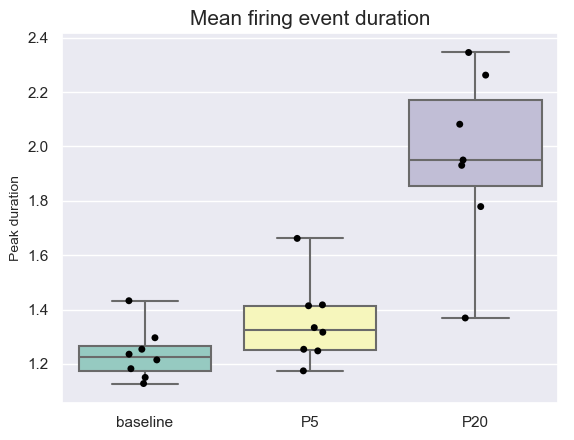

In [66]:
ax = sns.boxplot( data=meanpdur, whis=np.inf, palette = 'Set3')
ax = sns.stripplot(data=meanpdur, jitter=True, color="0")
plt.ylabel("Peak duration", size = 10)
plt.title('Mean firing event duration', size = 15)
plt.savefig('peakduration')
plt.show()

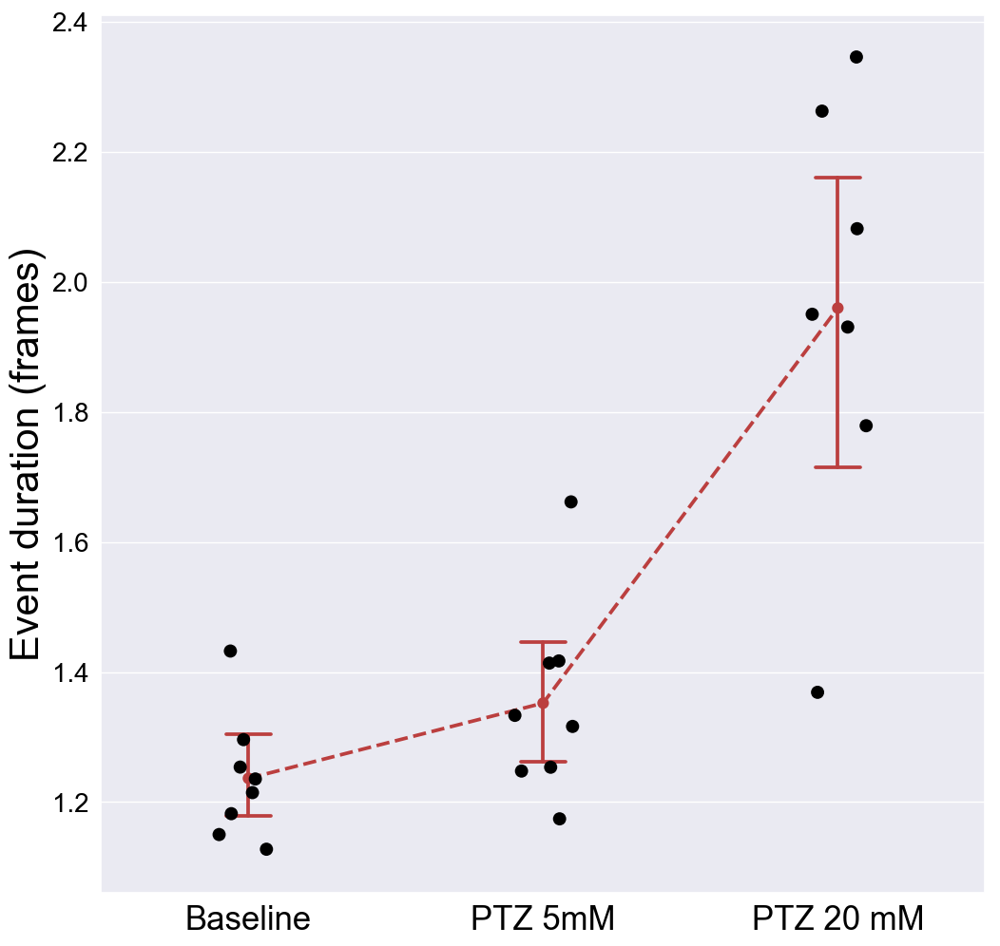

In [52]:

import seaborn as sns
sns.set_style("darkgrid")


fig, ax = plt.subplots(figsize = (12,12))

ax.set_yticklabels(['1.0', '1.2','1.4', '1.6', '1.8', '2.0', '2.2', '2.4'], fontsize = 20)



ax = sns.stripplot(data=meanpdur, jitter=True, color="0", size = 10)
ax = sns.pointplot(data=meanpdur, linestyles = ['--'], color="#bb3f3f", capsize = .15)
plt.ylabel("Event duration (frames)", size = 30, color = 'black')
plt.xticks(np.arange(3), ('Baseline','PTZ 5mM', 'PTZ 20 mM'), size = 25, color = 'black')
plt.yticks(color = 'black')
os.chdir(Ffig)
plt.savefig('peakduration.png')
plt.show()


In [25]:
win = 60*4
stp = 1
mtype = 'p_firing'
clims   = [0, .075]
bounds  = np.linspace(clims[0], clims[1], 1000)
cmap    = 'Spectral_r'

In [ ]:
import pandas as pd 
pd.DataFrame(Fishat[okgo[0]]).to_csv("190313_wt_F2_bln.csv")

In [16]:
Fishat[okgo[0]].shape

(8582, 9828)

In [26]:
#baseline
dat = Fishat[okgo[2]]
pks = Fishpkb[okgo[2]]
dis = dis

# Firing probability

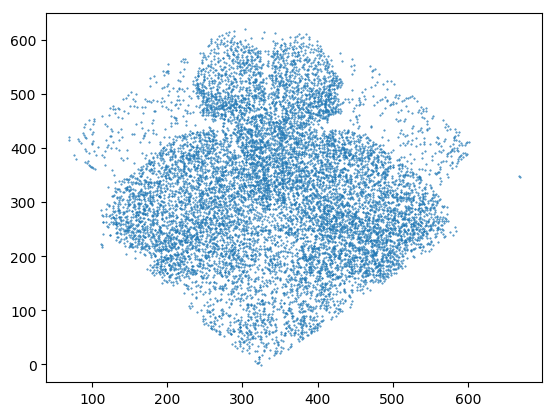

In [275]:
plt.scatter(blndf['xcoord'], blndf['ycoord'], s = 0.2)

In [9]:
basefish = Fishat[fli[0]]
p5fish = Fishat[fli[1]]
p20fish = Fishat[fli[2]]
basecord = Fishac[fli[0]]
p5cord = Fishac[fli[1]]
p20cord = Fishac[fli[2]]
os.chdir(Fdrop)
basebin = np.load(Fdrop + 'Project/PTZ/filtered/flt_190325_wtp_F1_bln/190325_wtp_F1_bln_all_bin.npy')
p5bin = np.load(Fdrop + 'Project/PTZ/filtered/flt_190325_wtp_F1_p05/190325_wtp_F1_p05_all_bin.npy')
p20bin = np.load(Fdrop + 'Project/PTZ/filtered/flt_190325_wtp_F1_p20/190325_wtp_F1_p20_all_bin.npy')

In [878]:
basebin.shape

(11178, 9828)

In [877]:
p20cord.shape

(8395, 3)

In [10]:
clims   = [0, .075]
bounds  = np.linspace(clims[0], clims[1], 1000)
cmap    = 'Spectral_r'

# Generate data to be plotted
#------------------------------------------------------------------------------
pf_bln   = winslide(basefish, basebin, mtype = 'p_firing')
pf_p5   = winslide(p5fish, p5bin, mtype = 'p_firing')
pf_p2   = winslide(p20fish, p20bin, mtype = 'p_firing')

Working on time step 1 of 40
Working on time step 2 of 40
Working on time step 3 of 40
Working on time step 4 of 40
Working on time step 5 of 40
Working on time step 6 of 40
Working on time step 7 of 40
Working on time step 8 of 40
Working on time step 9 of 40
Working on time step 10 of 40
Working on time step 11 of 40
Working on time step 12 of 40
Working on time step 13 of 40
Working on time step 14 of 40
Working on time step 15 of 40
Working on time step 16 of 40
Working on time step 17 of 40
Working on time step 18 of 40
Working on time step 19 of 40
Working on time step 20 of 40
Working on time step 21 of 40
Working on time step 22 of 40
Working on time step 23 of 40
Working on time step 24 of 40
Working on time step 25 of 40
Working on time step 26 of 40
Working on time step 27 of 40
Working on time step 28 of 40
Working on time step 29 of 40
Working on time step 30 of 40
Working on time step 31 of 40
Working on time step 32 of 40
Working on time step 33 of 40
Working on time ste

In [187]:
p20df

,xcoord,ycoord,plane,region,region_name
0,499.475032,323.646981,0.0,1.0,telencephalon
1,412.572270,369.011173,0.0,3.0,midbrain
2,474.114634,410.369817,0.0,2.0,diencephalon
3,284.145251,385.397165,0.0,0.0,0
4,311.459060,370.068897,0.0,0.0,0
5,455.602278,342.446753,0.0,2.0,diencephalon
6,238.230911,348.009020,0.0,0.0,0
7,490.067096,392.411003,0.0,1.0,telencephalon
8,457.245382,416.321987,0.0,2.0,diencephalon
9,241.471702,169.027185,0.0,0.0,hindbrain


In [185]:
timelist = [pret, earlyt, latet, postt]
pret = range(15)
earlyt = range(14,16)
latet = range(18,19)
postt = range(20,21)
temp = np.zeros((4,4))
len(temp[0])

4

In [240]:
tel = pf_p2[p20df['region_name'] == 'telencephalon']
die = pf_p2[p20df['region_name'] == 'diencephalon']
mid = pf_p2[p20df['region_name'] == 'midbrain']
hin = pf_p2[p20df['region_name'] == 'hindbrain']
stringlist = [tel, die, mid, hin]

temp = np.zeros((4,4))
counter = 0
conter = 0
for i in range(len(temp[0])):
    for x in range(len(stringlist)):
        temp[i,x] = np.mean(stringlist[x][:,timelist[i]])
    
pfiring = {'PRE': temp[0,:], 'EARLY': temp[1,:], 'LATE': temp[2,:], 'POST': temp[3,:]}
pfiringdf = pd.DataFrame.from_dict(pfiring)
pfiringdf = pfiringdf.rename(index = {0: 'forebrain', 1: 'diencephalon', 2: 'midbrain' , 3: 'hindbrain'})

In [241]:
pfiringdf

,PRE,EARLY,LATE,POST
forebrain,0.018192,0.086115,0.053267,0.001740
diencephalon,0.013820,0.099576,0.076584,0.002085
midbrain,0.017111,0.110624,0.054868,0.001810
hindbrain,0.016735,0.116045,0.042298,0.002432


In [1]:
forebrain	0.018192	0.086115	0.053267	0.001740
diencephalon	0.013820	0.099576	0.076584	0.002085
midbrain	0.017111	0.110624	0.054868	0.001810
hindbrain	0.016735	0.116045	0.042298	0.002432

SyntaxError: invalid syntax (<ipython-input-1-e2734a637c31>, line 1)

In [333]:
string = ['FORE', 'DIEN', 'MID', 'HINDBRAIN']
string1 = ['PRE', 'EARLY', 'LATE', 'POST']

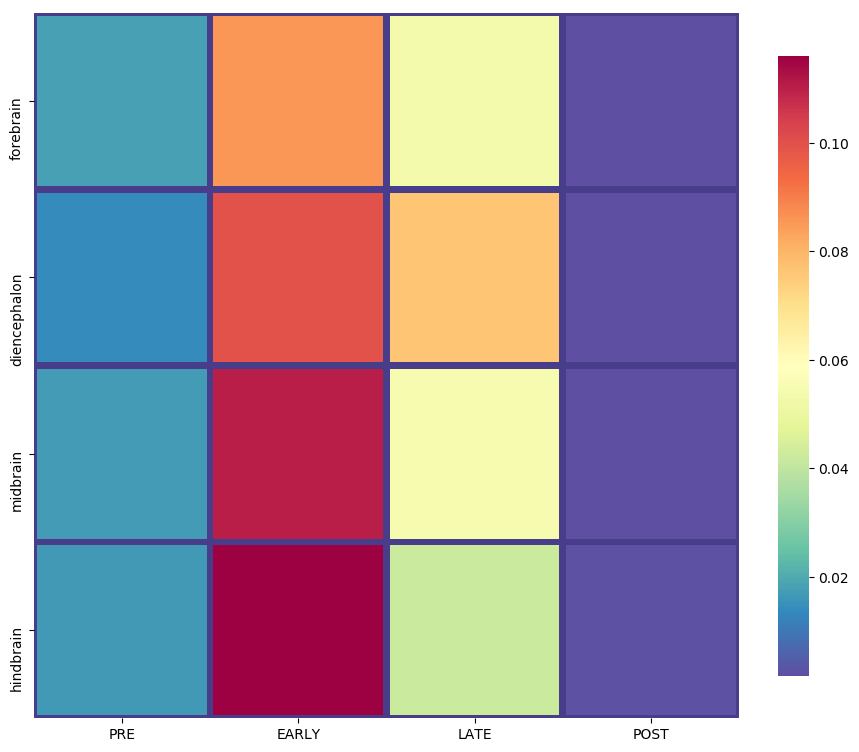

In [335]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(10,10))
ax = plt.gca()

ax = sns.heatmap(
    data = pfiringdf,
    square=True,
    linewidths=4,
    cmap='Spectral_r',
    cbar_kws={'fraction' : 0.04},
    linecolor = 'darkslateblue',
)

#ax.set_xticklabels(string1, fontsize = 20, color = 'white')
#ax.set_yticklabels(string, fontsize = 20, color = 'black')



plt.savefig('pfiringmat', transparent = True)


plt.show()

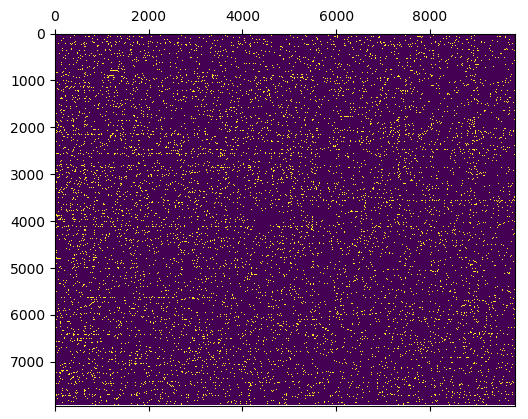

In [887]:
plt.matshow(basebin)

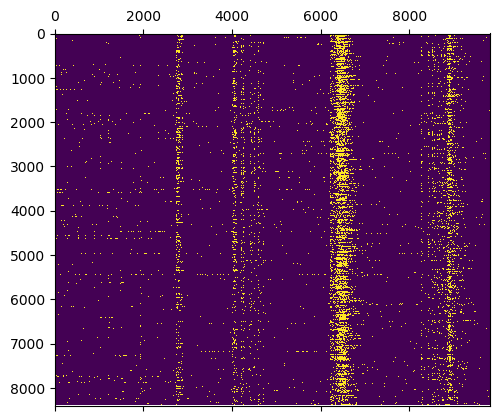

In [890]:
plt.matshow(p20bin)

In [933]:
colors = 'Spectral'

In [934]:
# set the colormap and centre the colorbar
class MidpointNormalize(colors.Normalize):

    def __init__(self, vmin=None, vmax=None, midpoint=None, clip=False):
        self.midpoint = midpoint
        colors.Normalize.__init__(self, vmin, vmax, clip)

    def __call__(self, value, clip=None):
# I'm ignoring masked values and all kinds of edge cases to make a
# simple example...
        x, y = [self.vmin, self.midpoint, self.vmax], [0, 0.5, 1]
        return np.ma.masked_array(np.interp(value, x, y), np.isnan(value))

AttributeError: 'str' object has no attribute 'Normalize'

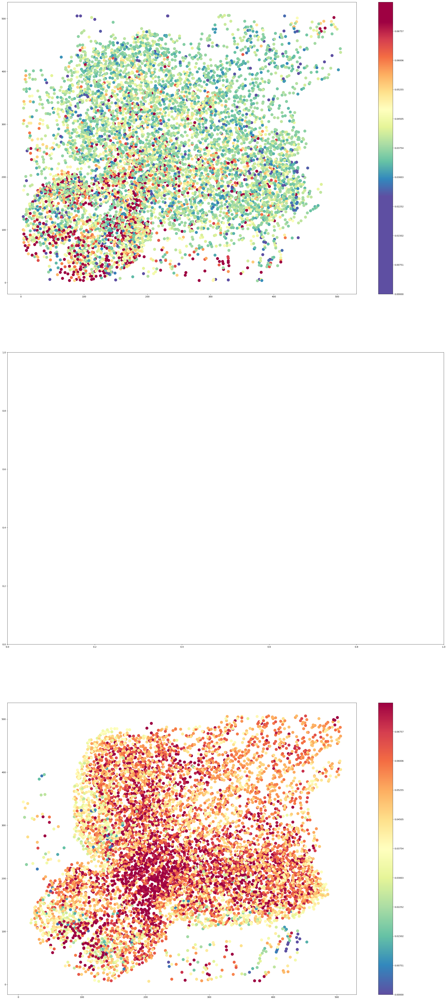

In [962]:
# Generate three subplots: Baseline, Early PTZ, Late PTZ
#------------------------------------------------------------------------------
fig, ax = plt.subplots(3,1, figsize = (35,80))

# Baseline
#------------------------------------------------------------------------------
pl_bl   = fishdot(basefish,basecord,  np.mean(pf_bln[:,10:], axis = 1), 
                     ax[0], cmap = 'Spectral_r')
cl_bl   = fig.colorbar(pl_bl, ax = ax[0], boundaries = bounds)
cl_bl.set_clim(0.025, 0.07)

# Early seizure
#------------------------------------------------------------------------------
#pl_p5   = fishdot(p5fish, p5cord, np.mean(pf_p5, axis = 1), 
                     #ax[1], cmap = cmap)
#cl_p1   = fig.colorbar(pl_p5, ax = ax[1], boundaries = bounds)
#cl_p1.set_clim(clims)

# Late seizure
#------------------------------------------------------------------------------
pl_p2   = fishdot(p20fish, p20cord, np.mean(pf_p2[:,10:], axis = 1),
                     ax[2], cmap = 'Spectral_r')
cl_p2   = fig.colorbar(pl_p2, ax = ax[2], boundaries = bounds)
cl_p2.set_clim(clims)

# post-ictal depression seizure
#------------------------------------------------------------------------------
#pl_p2   = fishdot(p20fish, p20cord, np.mean(pf_p2[:,20:21], axis = 1),
                     #ax[3], cmap = cmap)
#cl_p2   = fig.colorbar(pl_p2, ax = ax[3], boundaries = bounds)
#cl_p2.set_clim(clims)


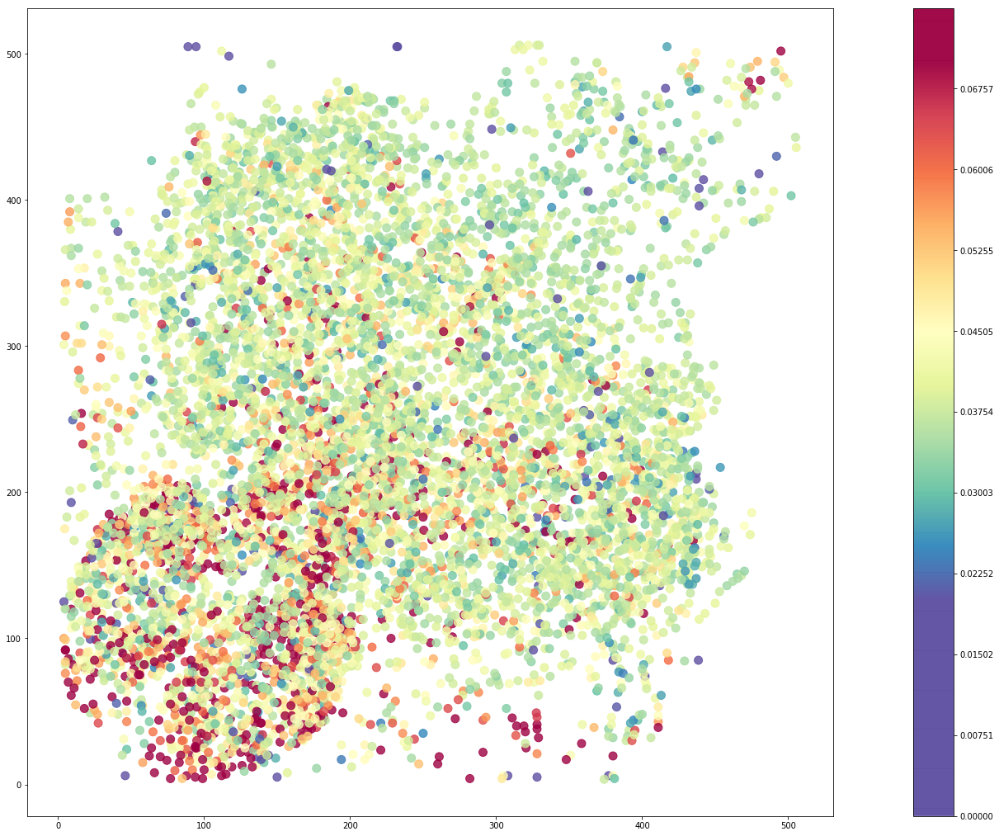

In [11]:
fig, ax = plt.subplots(figsize=(35,18))

pl_bl   = fishdot(basefish,basecord,  np.mean(pf_bln[:,10:], axis = 1), 
                     ax, cmap = 'Spectral_r')
cl_bl   = fig.colorbar(pl_bl, ax = ax, boundaries = bounds)
cl_bl.set_clim(0.02, 0.07)

plt.gca().set_aspect('equal', adjustable='box')
os.chdir(Ffig)
plt.savefig('pfiring_bln.png', transparent = True)
plt.show()

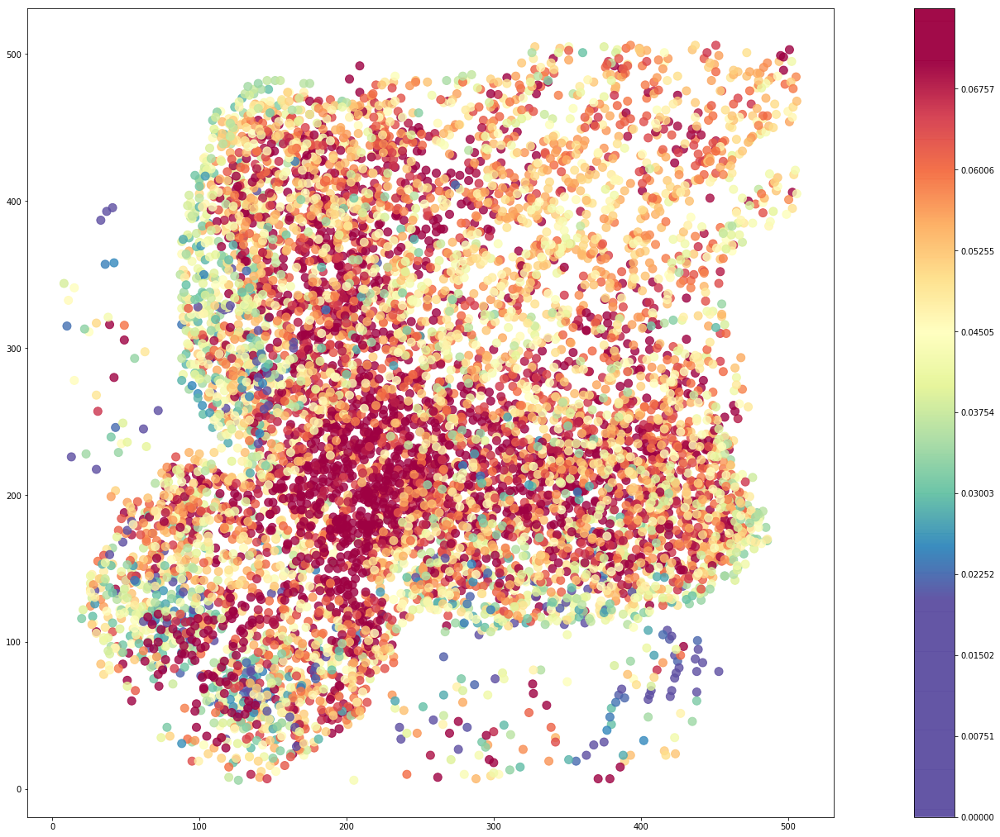

In [12]:
#------------------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(35,18))

pl_p2   = fishdot(p20fish, p20cord, np.mean(pf_p2[:,10:], axis = 1),
                     ax, cmap = 'Spectral_r')
cl_p2   = fig.colorbar(pl_p2, ax = ax, boundaries = bounds)
cl_p2.set_clim(0.02, 0.07)

plt.gca().set_aspect('equal', adjustable='box')
os.chdir(Ffig)
plt.savefig('pfiring_ptz.png', transparent = True)

In [ ]:
basefish[np.where(basebin == 1)[0]]

In [307]:
basecord[:,0]

array([182., 304., 196., ..., 180., 305., 465.])

# Initial segmentation into spatially contiguous clusters

In [96]:
# Run k-mean clustering on x-y coordinates to get spatially contiguous seed clusters
#-----------------------------------------------------------------------------------------
Fish = fn.fish_net_spacek(Fish, 15)

Now working on plane 0.0 of 9.0
Now working on plane 1.0 of 9.0
Now working on plane 2.0 of 9.0
Now working on plane 3.0 of 9.0
Now working on plane 4.0 of 9.0
Now working on plane 5.0 of 9.0
Now working on plane 6.0 of 9.0
Now working on plane 7.0 of 9.0
Now working on plane 8.0 of 9.0
Now working on plane 9.0 of 9.0


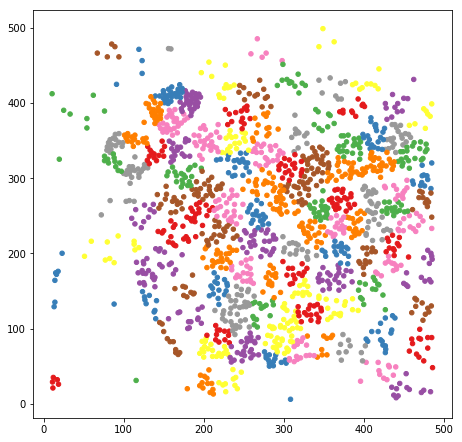

In [119]:
# Plot an illustrative example
#----------------------------------------------------------------------------------------
plane = 3

# Pull out the data from fish structure
#----------------------------------------------------------------------------------------
cs = Fish["Coordinates"]                  # 3D array of xyz coordinates
ci = Fish["Planes"][plane]["Index"]       # Index of plane coordinates in long list
ks = Fish["Planes"][plane]["Klabel"]      # Label from kmeans clustering

# Actual plotting routines
#----------------------------------------------------------------------------------------
fig = plt.figure(figsize = (7.5,7.5))

plt.scatter(cs[ci,0], cs[ci,1], s = 20, c = ks, cmap = 'Set1')
fig.savefig('plt')

In [111]:
cs[ci,2]

array([3., 3., 3., ..., 3., 3., 3.])

# Further parcellate according to functional correlation structure

In [123]:
# Calculate average traces within clusters
#----------------------------------------------------------------------------------------------
d      = Fish["Data"]
l      = Fish["Klabel"]
loc    = Fish["Coordinates"]
md,ml,mloc  = fn.fish_net_average(d,l,loc)

# Pack averaged data into Fish structure
#----------------------------------------------------------------------------------------------
Kdata = {"Label":ml, "Data":md, "Coordinates":mloc}
Fish.update({"Kdata":Kdata})

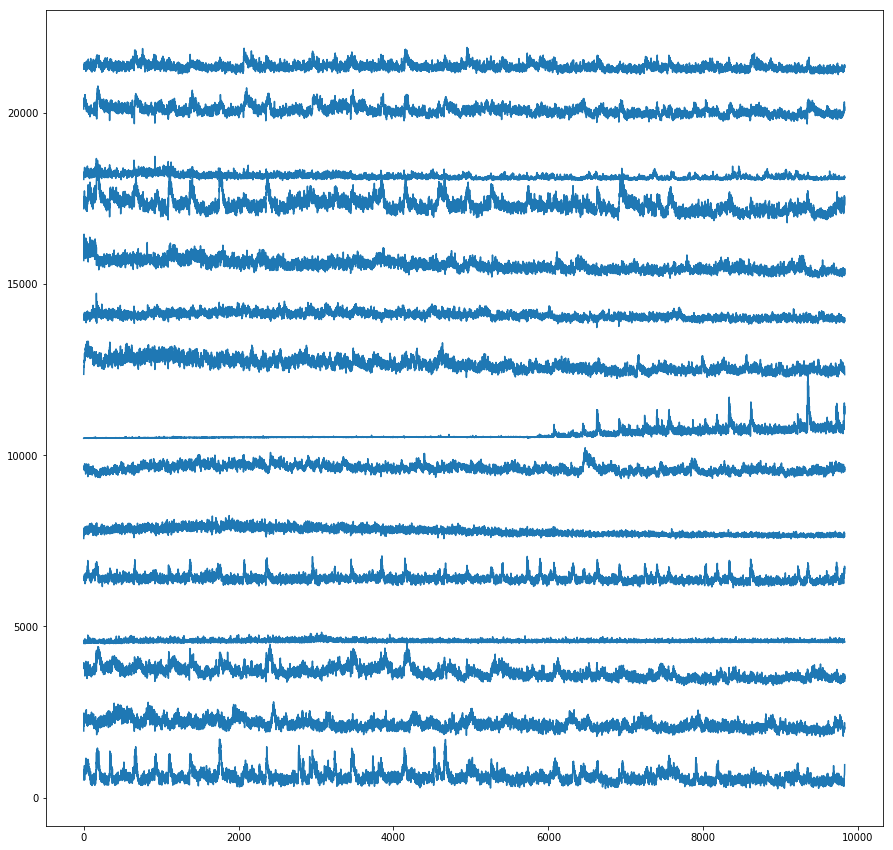

In [127]:
# Plot an example traces
#----------------------------------------------------------------------------------------------
nplt  = 15
d     = Fish["Kdata"]["Data"][:nplt,:]
cm    = plt.get_cmap("Paired")

plt.figure(figsize=(15,15))
for i in range(nplt):
    fig = plt.plot(d[i,:] + 1500*i, c=cm(1))
    

### _Find functionally related clusters_

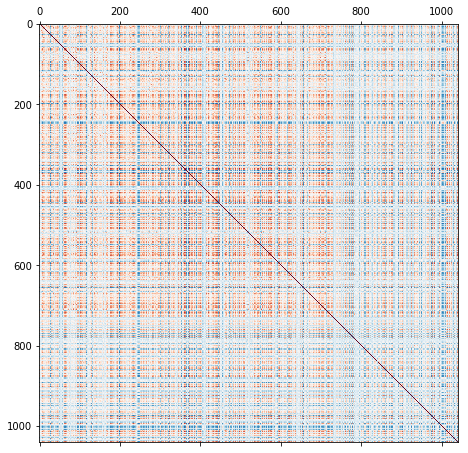

In [134]:
# Plot correlation matrix of drift corrected data
#---------------------------------------------------------------------------------
cor = np.corrcoef(Fish["Kdata"]["Data"])
plt.rc('figure', figsize=(7.5,7.5))
plt.matshow(cor, cmap='RdBu_r')

plt.savefig('plt')

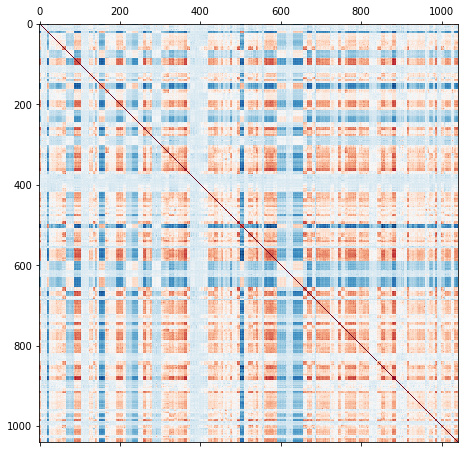

In [135]:
# Run K-means clustering on correlation matrix 
#------------------------------------------------------------------------------------
kmeans   = KMeans(n_clusters=100, random_state=0).fit(cor)
kl       = kmeans.labels_
outplot  = 'corr'       # corr or plane

# Plot an example plane
#-------------------------------------------------------------------------------------
if outplot == 'plane':
    plane = 3
    cs    = Fish["Kdata"]["Coordinates"]
    pi    = np.where(cs[:,2] == plane)[0]

    plt.figure(figsize=(5,5))
    plt.scatter(cs[pi,0], cs[pi,1], c=kl[pi], cmap = 'magma')

# Plot correlation matrix ordered by k-means cluster
#------------------------------------------------------------------------------------
if outplot == 'corr':
    klstd   = np.argsort(kl)
    scor    = cor[klstd,:]
    scor    = scor[:,klstd] 
    plt.rc('figure', figsize=(7.5,7.5))
    plt.matshow(scor,cmap='RdBu_r')
    
plt.savefig('plt')

### _Split up clusters that are too spatially separate_

In [138]:
# Split up clusters according to spatial parameters
#-----------------------------------------------------------------------
cs  = Fish["Kdata"]["Coordinates"]
ps  = fn.fish_net_divconq(kl,cs)      # Parcel labelling

# Unpack to single neuron level
#-----------------------------------------------------------------------
cs = Fish["Coordinates"]
ks = Fish["Klabel"]
lb = np.zeros((cs.shape[0],1))
for i in range(cs.shape[0]): lb[i] = ps[int(ks[i])]
    
# Average within label groups
#----------------------------------------------------------------------
md,ml,mloc = fn.fish_net_average(Fish["Filt"], lb, cs)
Ps = ({"Label":ps, "Coordinates":mloc, "Data":md})
Fish.update({"Parcels":Ps})


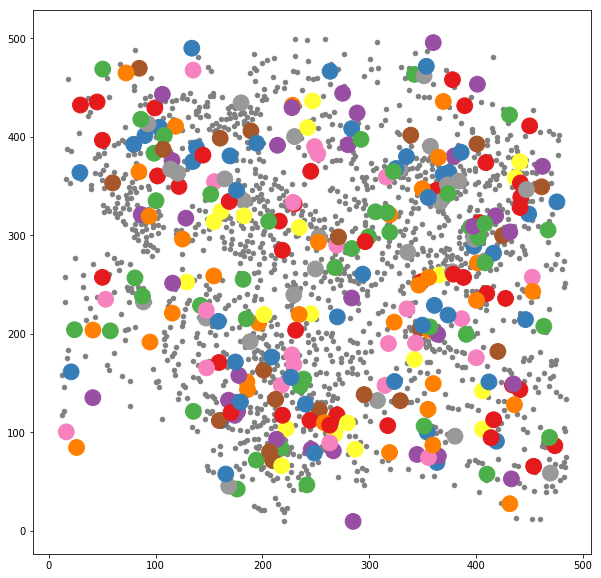

In [171]:
# Plot new categorisation
#-----------------------------------------------------------------------
fine_cs      = Fish["Coordinates"]
crse_cs      = Fish["Parcels"]["Coordinates"]
ks           = Fish["Klabel"]
fine_lb      = np.zeros((fine_cs.shape[0],1))
crse_lb      = np.zeros((crse_cs.shape[0],1))

for i in range(fine_cs.shape[0]): fine_lb[i] = ps[int(ks[i])]
for i in range(crse_cs.shape[0]): crse_lb[i] = Fish["Parcels"]["Label"][i]
    

cci    = np.where(Fish["Parcels"]["Coordinates"][:,2] == plane) 

# Actual plotting routines
#----------------------------------------------------------------------------------------
plane  = 5
fci    = Fish["Planes"][plane]["Index"]  
f, ax1 = plt.subplots(1, 1, sharey=True, figsize=(10,10))
ax1.scatter(fine_cs[fci,0], fine_cs[fci,1], s = 20, c = 'gray', cmap = 'Set1')
ax1.scatter(crse_cs[:,0], crse_cs[:,1], s = 250, c = crse_lb[:,0], cmap = 'Set1')

plt.savefig('plt')

(286, 1000)

<Figure size 1080x720 with 0 Axes>

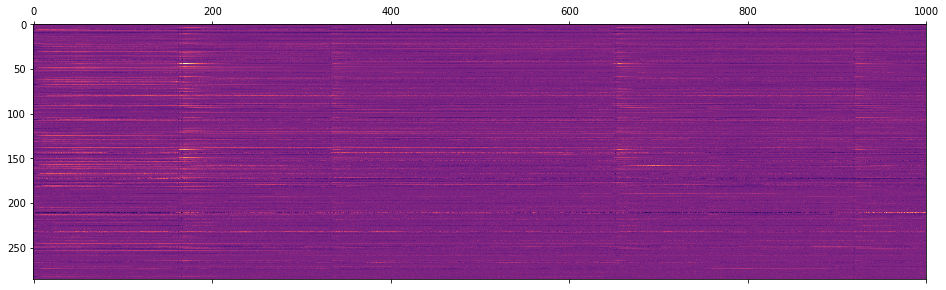

In [147]:
# Plot example module traces
#---------------------------------------------------------------------------------------
plt.figure(figsize=(15,10))
plt.matshow(Fish["Parcels"]["Data"][:400,:1000], cmap='magma')
Fish["Parcels"]["Data"][:400,:1000].shape

In [155]:
# Convert matrix into NetworkX Graph object to run module detection
#-------------------------------------------------------------------------------------
cor        = np.corrcoef(Fish["Parcels"]["Data"]); 
cor[cor < 0] = 0
G          = nx.from_numpy_array(cor)
partition  = community.best_partition(G)
M          = {"Label":np.asarray(partition.values())}
Fish.update({"Modules":M})

In [160]:
# Plot new categorisation
#-----------------------------------------------------------------------
c2k = np.ndarray.astype(Fish["Klabel"], 'int')            # 15811 labels in 1041 categories
k2p = np.ndarray.astype(Fish["Parcels"]["Label"], 'int')  # 1041 labels in 286 categories
p2m = np.ndarray.astype(Fish["Modules"]["Label"], 'int')  # 286 labels in 6 categories

# Assign labels
#----------------------------------------------------------------------
cs = Fish["Coordinates"]
lb = np.zeros((cs.shape[0],1))
for i in range(lb.shape[0]): lb[i] = p2m[k2p[c2k[i]]]
    
# Actual plotting routines
#----------------------------------------------------------------------------------------
f, ax = plt.subplots(2, 5, sharey=True, sharex=True, figsize=(50,25))
for p in range(10):
    plane  = p
    ci    = Fish["Planes"][plane]["Index"]  
    
    row    = int(np.floor(p/5))
    col    = int(p-5*np.floor(p/5))
    cmap   = plt.get_cmap('tab10', np.max(lb)+1)
    for l in np.unique(lb):
        li = ci[lb[ci,0] == l]
        ax[row,col].scatter(cs[li,0], cs[li,1], s = 50, c = cmap(l/np.max(lb)), label=l)
        
    ax[row,col].set_aspect('equal','box')
    ax[row,col].legend()



TypeError: int() argument must be a string, a bytes-like object or a number, not 'dict_values'

In [170]:
partition.values()

dict_values([0, 1, 2, 0, 0, 3, 2, 0, 0, 1, 1, 3, 3, 1, 2, 1, 0, 0, 3, 2, 2, 3, 0, 3, 0, 2, 0, 1, 0, 0, 0, 0, 3, 2, 3, 3, 0, 3, 1, 3, 1, 0, 3, 0, 3, 3, 2, 1, 3, 0, 3, 0, 3, 0, 0, 1, 2, 2, 2, 3, 0, 3, 4, 0, 0, 3, 3, 1, 0, 3, 1, 0, 0, 3, 0, 1, 3, 0, 3, 3, 0, 0, 3, 3, 3, 0, 1, 1, 1, 0, 0, 1, 3, 0, 3, 0, 0, 1, 1, 3, 0, 1, 2, 0, 0, 3, 2, 0, 0, 1, 1, 3, 1, 2, 1, 0, 0, 3, 2, 2, 3, 0, 3, 0, 2, 0, 1, 0, 0, 0, 0, 1, 3, 3, 0, 3, 1, 3, 1, 0, 3, 3, 1, 3, 0, 0, 1, 2, 2, 2, 3, 0, 3, 4, 0, 0, 3, 1, 0, 3, 0, 0, 3, 0, 1, 0, 0, 3, 0, 0, 3, 3, 3, 1, 0, 1, 0, 1, 3, 5, 0, 1, 3, 1, 0, 0, 3, 2, 1, 2, 0, 2, 2, 0, 0, 0, 1, 3, 1, 4, 0, 1, 2, 2, 0, 0, 3, 1, 0, 3, 1, 0, 0, 3, 0, 0, 0, 0, 0, 3, 1, 0, 0, 2, 0, 1, 1, 2, 0, 0, 2, 2, 0, 1, 0, 1, 2, 0, 3, 1, 3, 1, 0, 2, 2, 2, 0, 0, 1, 0, 3, 0, 1, 0, 3, 0, 0, 1, 0, 0, 2, 2, 2, 3, 2, 3, 1, 0, 1, 2, 2, 3, 0, 2, 0, 0, 2, 1, 1, 2, 1, 2, 2, 0, 0, 2])

In [ ]:
# Detect activity in more than 3 connected ROIs
#----------------------------------------------------------------------------
pks = Fish["Peaks"]
nnb = Fish["NNGraph"]
# pkg,avsz = fn.fish_net_avalanche(pks, nnb)

# Pull out module indices
#-----------------------------------------------------------------------
c2k = np.ndarray.astype(Fish["Klabel"], 'int')            # 15811 labels in 1041 categories
k2p = np.ndarray.astype(Fish["Parcels"]["Label"], 'int')  # 1041 labels in 286 categories
p2m = np.ndarray.astype(Fish["Modules"]["Label"], 'int')  # 286 labels in 6 categories

lb = np.zeros((cs.shape[0],1))
for i in range(lb.shape[0]): lb[i] = p2m[k2p[c2k[i]]]

A = []
for m in np.unique(p2m):
    print('Working on module ' + str(m))
    ti       = lb == m
    tnnb = nnb[ti[:,0],:]
    tnnb = tnnb[:,ti[:,0]]
    pkg,avsz = fn.fish_net_avalanche(pks[ti[:,0],:], tnnb)
    A.append({"pkg":pkg, "avsz":avsz})

Module 5 is empty


/Users/roschkoenig/anaconda3/lib/python2.7/site-packages/ipykernel_launcher.py:12: RuntimeWarning: divide by zero encountered in log
  if sys.path[0] == '':


<Figure size 1080x1080 with 0 Axes>

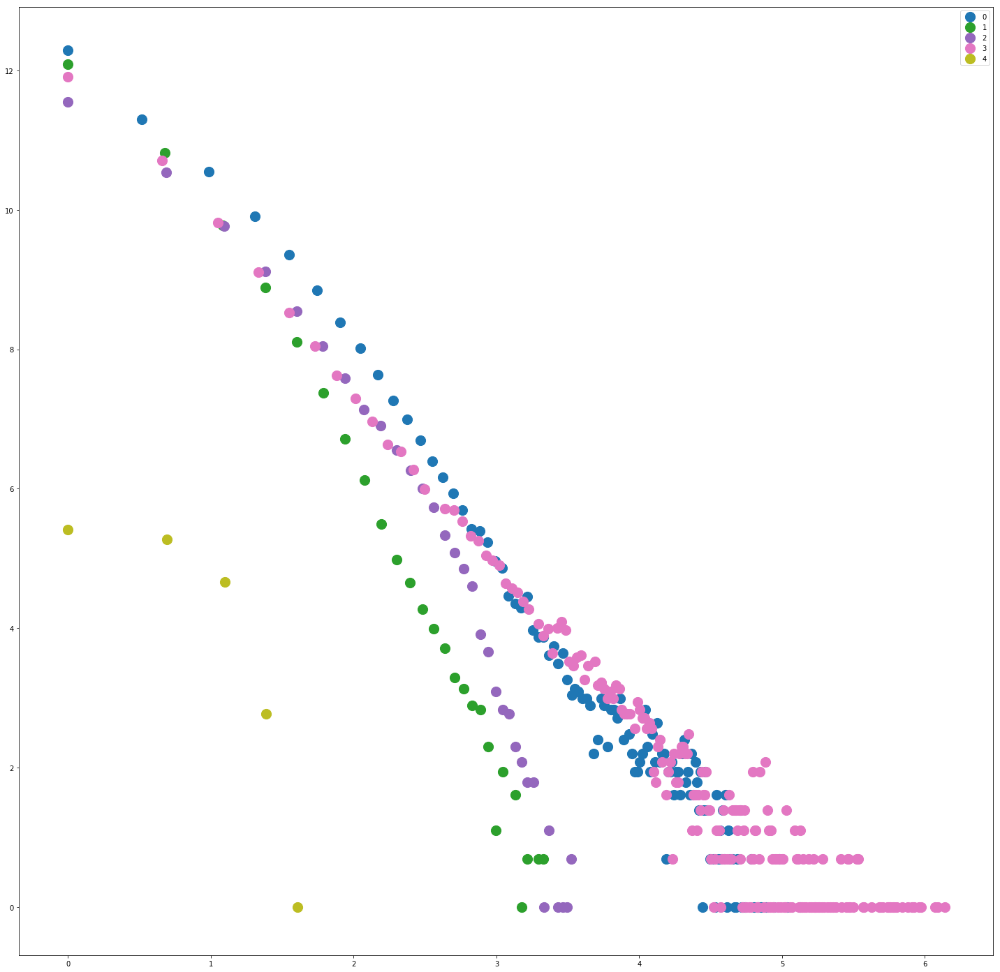

In [442]:
# Plot avalanches
#------------------------------------------------------------------------------
plt.figure(figsize=(15,15))
cmap   = plt.get_cmap('tab10', len(A))
f, ax  = plt.subplots(1,1, sharey=True, sharex=True, figsize=(25,25))

for i in range(len(A)):
    # Plot log-log histogram
    #-----------------------------------------------------------------------------------------
    if A[i]: a  = A[i]["avsz"] 
    if a.size != 0: 
        ls  = np.linspace(np.min(a), np.max(a), 500)
        ah  = np.histogram(a, bins = ls)
        ax.scatter(np.log(ah[1][:-1]), np.log(ah[0]), s = 200, c = cmap(float(i)/len(A)), label=i)
    else: 
        print('Module ' + str(i) + ' is empty')

ax.legend()


In [173]:
# Plot correlation matrix
#---------------------------------------------------------------------------------------------
cor = np.corrcoef(Fish["Kdata"]["Data"])
k2p = np.ndarray.astype(Fish["Parcels"]["Label"], 'int')  # 1041 labels in 286 categories
p2m = np.ndarray.astype(Fish["Modules"]["Label"], 'int')  # 286 labels in 6 categories
lb  = np.zeros((cor.shape[0],1))

for i in range(lb.shape[0]): lb[i] = p2m[k2p[i]]
lb = lb[:,0]

# Plot correlation matrix ordered 
#------------------------------------------------------------------------------------
f, ax   = plt.subplots(1,2, sharey=True, figsize=(40,25), gridspec_kw = {'width_ratios':[1, 10]})
klstd   = np.argsort(lb)
scor    = cor[klstd,:]
scor    = scor[:,klstd] 

cmap    = plt.get_cmap('tab10', np.max(lb) + 1)
allc    = np.flip(np.true_divide(lb[klstd],np.max(lb)), axis=0)
ally    = np.asarray(range(np.max(klstd), -1, -1))

for l in np.unique(lb):
    pl = np.where(lb[klstd] == l)[0]
    for p in pl:
        ax[0].axhline(ally[int(p)], color = cmap(allc[p]), linewidth=3)
                      
cax = ax[1].matshow(scor,cmap='RdBu_r')
f.colorbar(cax)



TypeError: int() argument must be a string, a bytes-like object or a number, not 'dict_values'

In [529]:
allc

array([1. , 0.8, 0.8, ..., 0. , 0. , 0. ])

In [162]:
ck

u'lightblue'

In [602]:
l

[(2, 1), (2, 2)]